<a href="https://colab.research.google.com/github/Dahernandezsilve/HT1MD/blob/main/HT_1_An%C3%A1lisis_Exploratorio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Universidad del Valle de Guatemala
18 Avenida 11-95 Guatemala      
Departamento de Computación     
Facultad de Ingeniería       
Minería de Datos Sección 10         
Fecha de entrega: 29/01/2024        

Grupo 6 | Integrantes:
- Diego Alexander Hernández Silvestre 21270
- Linda Inés Jimenez Vides 21169
- Daniel Armando Valdez Reyes 21240

## HDT6 - House Prices
Para realizar una exploración inicial del conjunto de datos, se prodeció a realizar un resumen de la información proporcionada en el dataset del archivo "*train.csv*. A continuación se muestran los resultados: 

*Primero se importan todas la librerías requeridas para llevar a cabo el análisis*

In [17]:
import pandas as pd
from scipy.stats import shapiro, ks_2samp, anderson
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from typing import *
import matplotlib.pyplot as plt
from sklearn import datasets
import sklearn as sklearn
import sklearn.cluster as cluster
import sklearn.metrics as metrics
from sklearn.preprocessing import StandardScaler
import scipy.cluster.hierarchy as sch
import skfuzzy as fuzz
import pylab
import sklearn.mixture as mixture
import pyclustertend 
import random
import statsmodels.api as sm
import statsmodels.stats.diagnostic as smd
from sklearn.linear_model import LinearRegression
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.linear_model import Ridge
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot
from yellowbrick.regressor import ResidualsPlot
import scipy.stats as stats
import statsmodels.stats.diagnostic as diag
from scipy.stats import normaltest
from sklearn.tree import plot_tree, export_text


Se lleva a cabo un análisis identificando los tipos de variables involucradas:
## Descripcion de variables
- MSSubClass: Cuantitativa Discreta
- MSZoning: Cualitativa Categorica	
- LotFrontage: Cuantitativa Medible
- LotArea: Cuantitativa Medible
- Street: Cualitativa Categorica
- Alley: Cualitativa Categorica
- LotShape: Cualitativa Categorica       
- LandContour: Cualitativa Categorica
- Utilities: Cualitativa Categorica		
- LotConfig: Cualitativa Categorica
- LandSlope: Cualitativa Categorica 
- Neighborhood: Cualitativa Categorica
- Condition1: Cualitativa Categorica
- Condition2: Cualitativa Categorica
- BldgType: Cualitativa Categorica
- HouseStyle: Cualitativa Categorica 
- OverallQual: Cuantitativa Discreta
- OverallCond: Cuantitativa Discreta
- YearBuilt: Cuantitativa Discreta
- YearRemodAdd: Cuantitativa Discreta
- RoofStyle: Cualitativa Categorica
- RoofMatl: Cualitativa Categorica
- Exterior1st: Cualitativa Categorica
- Exterior2nd: Cualitativa Categorica
- MasVnrType: Cualitativa Categorica
- MasVnrArea: Cuantitativa Continua
- ExterQual: Cualitativa Categorica 
- ExterCond: Cualitativa Categorica
- Foundation: Cualitativa Categorica
- BsmtQual: Cualitativa Ordinal
- BsmtCond: Cualitativa Categorica
- BsmtExposure: Cualitativa Categorica 
- BsmtFinType1: Cualitativa Categorica
- BsmtFinSF1: Cuantitativa Continua
- BsmtFinType2: Cualitativa Categorica
- BsmtFinSF2: Cuantitativa Continua
- BsmtUnfSF: Cuantitativa Continua
- TotalBsmtSF: Cuantitativa Continua
- Heating: Cualitativa Categorica
- HeatingQC: Cualitativa Categoriica
- CentralAir: Cualitativa Categorica
- Electrical: Cualitativa Categorica
- 1stFlrSF: Cuantitativa Continua
- 2ndFlrSF: Cuantitativa Continua
- LowQualFinSF: Cuantitativa Continua
- GrLivArea: Cuantitativa Continua
- BsmtFullBath: Cuantitativa Discreta
- BsmtHalfBath: Cuantitativa Discreta
- FullBath: Cuantitativa Discreta
- HalfBath: Cuantitativa Discreta
- Bedroom: Cuantitativa Discreta
- Kitchen: Kitchens above grade
- KitchenQual: Cualitativa Categorica
- TotRmsAbvGrd: Cuantitativa Discreta
- Functional: Cualitativa Categorica
- Fireplaces: Cuantitativa Discreta
- FireplaceQu: Cualitativa Categorica
- GarageType: Cualitativa Categorica		
- GarageYrBlt: Cuantitativa Discreta
- GarageFinish: Cualitativa Categorica
- GarageCars: Cuantitativa Discreta
- GarageArea: Cuantitativa Continua
- GarageQual: Cualitativa Categorica
- GarageCond: Cualitativa Categorica 
- PavedDrive: Cualitativa Categorica
- WoodDeckSF: Cuantitativa Continua
- OpenPorchSF: Cuantitativa Continua
- EnclosedPorch: Cuantitativa Continua
- 3SsnPorch: TCuantitativa Continua
- ScreenPorch: Cuantitativa Continua
- PoolArea: Cuantitativa Continua
- PoolQC: Cualitativa Categorica
- Fence: Cualitativa Categorica
- MiscFeature: Cualitativa Categorica
- MiscVal: Cuantitativa Discreta
- MoSold: Cuantitativa Discreta
- YrSold: Cuantitativa Discreta
- SaleType: Cualitativa Categorica
- SaleCondition: Cualitativa Categorica

*Antes de llevar a cabo el análisis se realiza una carga de los datos y se realizá una serie de preprocesamientos para que la información sea útil para el análisis como llenar con 0s o realizar las conversiones debidas a elementos tipo *NaN***

In [18]:
dataframe: pd.DataFrame = pd.read_csv("train.csv",  encoding='ISO-8859-1')

dataframe.columns
dataframe['PoolQC'] = dataframe['PoolQC'].fillna(0) # Se rellenan con 0 los na de PoolQC
dataframe['MasVnrType'] = dataframe['MasVnrType'].fillna('None') # Se rellenan con 'None' los na 'MasVnrType'
dataframe['FireplaceQu'] = dataframe['MasVnrType'].fillna('NA')
dataframe['Fence'] = dataframe['Fence'].fillna('NA')
dataframe['MiscFeature'] = dataframe['MiscFeature'].fillna('NA')
dataframe['LotFrontage'] = dataframe['LotFrontage'].fillna(0)
dataframe['Alley'] = dataframe['Alley'].fillna('NA')
#dataframe['GarageYrBlt'] = dataframe['GarageYrBlt'].fillna(dataframe['GarageYrBlt'].mean())
#dataframe['MasVnrArea'] = dataframe['MasVnrArea'].fillna(dataframe['MasVnrArea'].mean())

dataframe.drop(['Id'], axis=1, inplace=True) #Se elimina la columna Id

infoSumary = dataframe.info() #Mostrar información del tipo de variables utilizadas

#Extraccion de las columnas a utilizar para las pruebas de clustering y regresion lineal
df = dataframe
df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,...,0,0,NA,NA,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,...,0,0,NA,NA,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,...,0,0,NA,NA,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,...,0,0,NA,NA,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,0,8,2007,WD,Normal,175000
1456,20,RL,85.0,13175,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,MnPrv,NA,0,2,2010,WD,Normal,210000
1457,70,RL,66.0,9042,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,20,RL,68.0,9717,Pave,NA,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,0,4,2010,WD,Normal,142125


Dentro del preprocesamiento de datos se convirtieron algunas variables cualitativas a su versión cuantitativas que se consideraron que pueden ser útiles para el análisis exploratorio, el clustering y la predicción de valores mediante regresiones lineales.  

In [19]:
def change(variable):
    dictValue = {'NA': 0}
    count = 1

    def changeToVariable(x):
        nonlocal count  # Para indicar que count es una variable no local
        if x in dictValue:
            return dictValue[x]
        else:
            dictValue[x] = count
            count += 1
            return dictValue[x]
        
    if not pd.api.types.is_numeric_dtype(dataframe[variable]):
        df[variable] = dataframe[variable].apply(changeToVariable)
    
        print(f'Para la variable {variable} los valores ahora son: ')
        for key, value in dictValue.items():
            print(key, ":", value)
    else:
        print(f"La columna {variable} es numerica")

variables = [
    'MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
    'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
    'OverallCond', 'YearBuilt', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
    'ExterCond', 'Foundation', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'TotalBsmtSF', 'Heating',
    'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
    'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType'
]

for variable in variables:
    change(variable=variable)

La columna MSSubClass es numerica
Para la variable MSZoning los valores ahora son: 
NA : 0
RL : 1
RM : 2
C (all) : 3
FV : 4
RH : 5
Para la variable Street los valores ahora son: 
NA : 0
Pave : 1
Grvl : 2
Para la variable Alley los valores ahora son: 
NA : 0
Grvl : 1
Pave : 2
Para la variable LotShape los valores ahora son: 
NA : 0
Reg : 1
IR1 : 2
IR2 : 3
IR3 : 4
Para la variable LandContour los valores ahora son: 
NA : 0
Lvl : 1
Bnk : 2
Low : 3
HLS : 4
Para la variable Utilities los valores ahora son: 
NA : 0
AllPub : 1
NoSeWa : 2
Para la variable LotConfig los valores ahora son: 
NA : 0
Inside : 1
FR2 : 2
Corner : 3
CulDSac : 4
FR3 : 5
Para la variable LandSlope los valores ahora son: 
NA : 0
Gtl : 1
Mod : 2
Sev : 3
Para la variable Neighborhood los valores ahora son: 
NA : 0
CollgCr : 1
Veenker : 2
Crawfor : 3
NoRidge : 4
Mitchel : 5
Somerst : 6
NWAmes : 7
OldTown : 8
BrkSide : 9
Sawyer : 10
NridgHt : 11
NAmes : 12
SawyerW : 13
IDOTRR : 14
MeadowV : 15
Edwards : 16
Timber : 17
Gilber

In [20]:
print('Se determina que el tamaño del dataframe con el que se está trabajando es de',len(dataframe),'datos (filas) incluyendo los encabezados de la tabla.')

Se determina que el tamaño del dataframe con el que se está trabajando es de 1460 datos (filas) incluyendo los encabezados de la tabla.


En este estudio, se decidió como convención realizar transformaciones de datos únicamente a aquellas columnas que cuentan con una cantidad de valores *NaN* mayor a 50 y son cuantitativas. Con este margen, únicamente dos columnas no fueron transformadas:

In [21]:
# Extrae la información relevante del resumen
info_data = {'Columna': [], 'Non-Null Count': [], 'Dtype': []}

for col in dataframe.columns:
    info_data['Columna'].append(col)
    info_data['Non-Null Count'].append(dataframe[col].count())
    info_data['Dtype'].append(dataframe[col].dtype)

# Crea un nuevo DataFrame a partir de la información extraída
info_df = pd.DataFrame(info_data)

info_df[info_df['Non-Null Count']<1460]


,Columna,Non-Null Count,Dtype
25,MasVnrArea,1452,float64
30,BsmtCond,1423,object
34,BsmtFinType2,1422,object
58,GarageYrBlt,1379,float64


Se retiran las filas que contengan *NaN* en la columna de respuesta **SalePrice** debido a que es la variable principal que se está estudiando.

In [22]:
dataframe['SalePrice'] =dataframe['SalePrice'].dropna()
dataframe['SalePrice']


0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

Posteriormente, se procedió a realizar un análisis estadístico de normalidad y comparación de distribuciones para las columnas númericas en el dataframe preprocesado, aplicando pruebas de Shapiro-Wilk y Anderson-Darling. A manera de contar con un análisis detallado de los procedimientos realizados, se imprimen todos los cálculos y se muestran en gráficas. Son una extensa cantidad de datos, por lo que leugo de estos resultados y gráficas, se muestran los resultados relevantes.

In [23]:
df = dataframe.copy()
df2n = df.select_dtypes(include='number').copy()

df2 = df2n.copy()
df2 = pd.DataFrame(df2, columns=df2n.columns)

shapiro_results = []
shapiro_resultsD = {}
anderson_results = []
anderson_resultsD = {}

for column in df2.columns:
    stat, p_value = shapiro(df[column])
    print(f'Columna {column}: Estadística={stat:.4f}, p-valor={p_value:.4f}')
    
    # Interpretación del resultado
    if p_value > 0.05:
        print(f'\033[92mLa columna {column} sigue una distribución normal.\033[0m')
        shapiro_results.append(column)
        shapiro_resultsD[column] = p_value
    else:
        print(f'\033[91mLa columna {column} no sigue una distribución normal.\033[0m')
    
for column in df2.columns:
    result = anderson(df[column])
    statistic = result.statistic
    critical_values = result.critical_values
    significance_level = result.significance_level

    print(f'Columna {column}: Estadística={statistic:.4f}')

    # Comparar la estadística con los valores críticos
    for i, alpha in enumerate([15.0, 10.0, 5.0, 2.5, 1.0]):
        if statistic > critical_values[i]:
            print(f'La columna {column} no sigue una distribución normal al {alpha}% de confianza.')
            break
    else:
        print(f'\033[92mLa columna {column} sigue una distribución normal al 1% de confianza.\033[0m')
        anderson_results.append(column)
        anderson_resultsD[column] = statistic


"""for column in df2.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(df2[column], kde=True)
    plt.title(f'Distribución de {column}')
    plt.xlabel(column)
    plt.ylabel('Frecuencia')
    plt.show()"""

# Prueba de Kolmogorov-Smirnov para cada par de columnas
for i in range(len(df2.columns)):
    for j in range(i+1, len(df2.columns)):
        stat, p_value = ks_2samp(df2.iloc[:, i], df2.iloc[:, j])
        print(f'Comparación entre {df2.columns[i]} y {df2.columns[j]}: Estadística={stat:.4f}, p-valor={p_value:.4f}')


Columna MSSubClass: Estadística=0.8046, p-valor=0.0000
La columna MSSubClass no sigue una distribución normal.
Columna MSZoning: Estadística=0.4803, p-valor=0.0000
La columna MSZoning no sigue una distribución normal.
Columna LotFrontage: Estadística=0.9006, p-valor=0.0000
La columna LotFrontage no sigue una distribución normal.
Columna LotArea: Estadística=0.3511, p-valor=0.0000
La columna LotArea no sigue una distribución normal.
Columna Street: Estadística=0.0362, p-valor=0.0000
La columna Street no sigue una distribución normal.
Columna Alley: Estadística=0.2529, p-valor=0.0000
La columna Alley no sigue una distribución normal.
Columna LotShape: Estadística=0.6593, p-valor=0.0000
La columna LotShape no sigue una distribución normal.
Columna LandContour: Estadística=0.3348, p-valor=0.0000
La columna LandContour no sigue una distribución normal.
Columna Utilities: Estadística=0.0087, p-valor=0.0000
La columna Utilities no sigue una distribución normal.
Columna LotConfig: Estadística=

Comparación entre YearRemodAdd y GarageArea: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y GarageQual: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y GarageCond: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y PavedDrive: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y WoodDeckSF: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y OpenPorchSF: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y EnclosedPorch: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y 3SsnPorch: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y ScreenPorch: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y PoolArea: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y PoolQC: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y Fence: Estadística=1.0000, p-valor=0.0000
Comparación entre YearRemodAdd y MiscFeature: E

In [24]:
data = df2.copy()
# Variable para guardar el error cuadratico medio de los modelos
RMSE_dictModels = {}
classification_METRICS = {}

# Resultados
De esta manera las columnas que muestran distribuciones normales son:

In [25]:
print("Segun Shapiro las que siguen una distribucion normal son:")

for shap in shapiro_results:
    print(shap,"con un p value de : ", shapiro_resultsD[shap])

print("\nSegun Anderson las que siguen una distribucion normal son:")
for andie in anderson_results:
    print(andie, "con un valor de: ", anderson_resultsD[andie])

Segun Shapiro las que siguen una distribucion normal son:
MasVnrArea con un p value de :  1.0
GarageYrBlt con un p value de :  1.0

Segun Anderson las que siguen una distribucion normal son:
MasVnrArea con un valor de:  nan
GarageYrBlt con un valor de:  nan


Tras realizar el análisis exploratorio se decidió hacer un mapa de calor de los datos para obtener una matriz de correlación y así verificar si existen relaciones lineales entre las variables estudiadas.

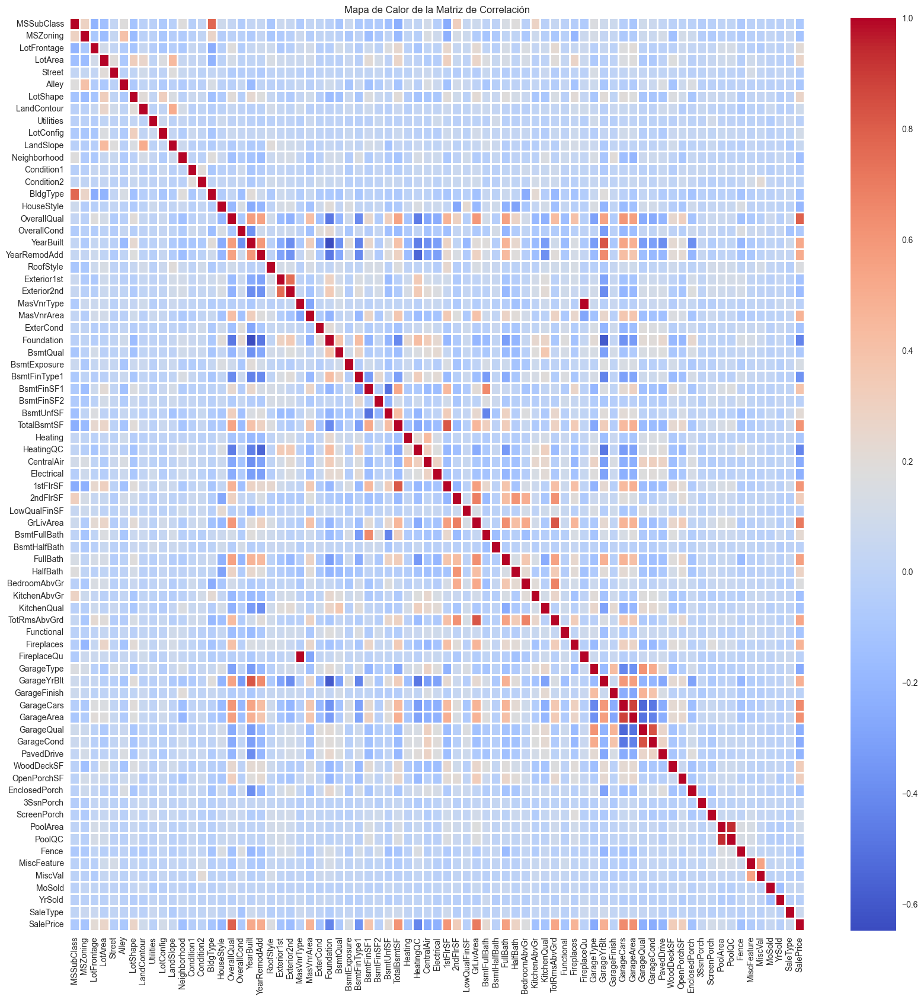

In [26]:
df_numeric = dataframe.select_dtypes(include='number').copy()

# Mapa de calor para visualizar la matriz de correlación
plt.figure(figsize=(20, 20))
correlation_matrix = df_numeric.corr()
sns.heatmap(correlation_matrix, cmap='coolwarm', linewidths=1)

plt.title('Mapa de Calor de la Matriz de Correlación')
plt.show()

De las correlaciones relevantes relacionadas con la variable de estudio **salePrice** se destacan:

Correlación alta:
- OverallQual
- GarageCars
- GarageArea
- GrLivArea
- FullBath
- Fireplaces

Correlación media-alta:
- YearBuilt
- YearRemodAdd
- MasVnrArea
- 1stFIrSF
- TotRmsAbvGrd
- GarageYrBlt
  
Correlación media:
- LotFrontage
- LotArea
- LotShape
- BsmtUnfSF
- 2ndSFrSF
- BsmtFullBath
- HalfBath
- BedroomAbrGr
- WoodDeckSF
- OpenPorchSF

(Ingeniería de características) Por lo que para realizar predicciones mediante el modelo de regresión lineal, se podría utilizar cualquiera de las mencionadas. La que se seleccionará es OverallQual para realizar tanto el clustering como el modelo de regresión lineal debido a que es la que presenta mejor correlación y por lo tanto, puede ser la variable más predictora. 

### Clustering
Del total de columnas que contenía el dataset original, únicamente no se tomarán en cuenta 5 para el clustering de datos. 

In [27]:
len(df.columns) - len(df2.columns)

5

A manera de proporcionar una representación de los valores se muestrala distribución de valores para cada columna numérica en el df2 a través de histogramas.

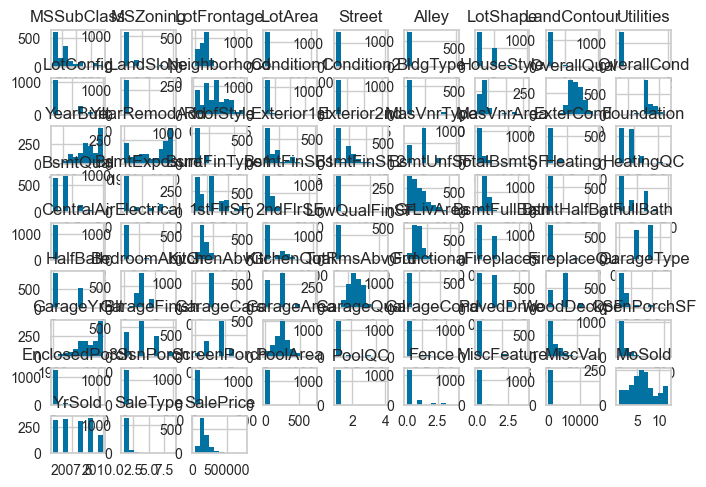

In [28]:

df2.groupby('SalePrice').size()
df2.hist()
plt.show()

Para llevar a cabo clustering se obtuvieron dos variables X y Y.

X contiene las características (todas las columnas después de eliminar filas con valores nulos) y Y contiene la variable de destino 'SalePrice'. La forma de X te proporciona información sobre la estructura de los datos.

In [29]:
X = np.array(df2.dropna())
Y = np.array(df2['SalePrice'])
X.shape

(1371, 75)

Luego se utiliza una semilla aleatoria, se hace un escalamiento del conjunto de datos y luego se calcula el índice de Hopkins para evaluar la tendencia del conjunto de datos.

In [30]:
random.seed(123)
X_scale=sklearn.preprocessing.scale(X)

pyclustertend.hopkins(X,len(X))

0.029723194258099345

El índice de Hopkins obtenido es **0.12253843344834266**. Este valor indica que hay una tendencia moderada a la agrupacion de datos.

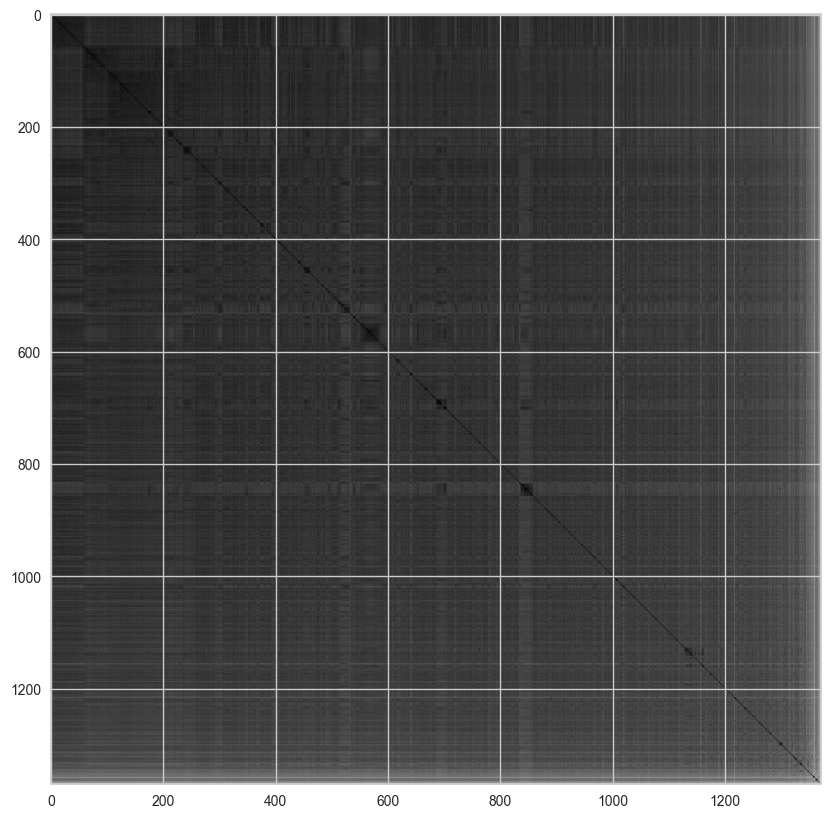

In [31]:
pyclustertend.vat(X_scale)

La visualización generada por el método VAT nos indica la presencia de 9 posibles grupos para realizar en el proceso de clustering.

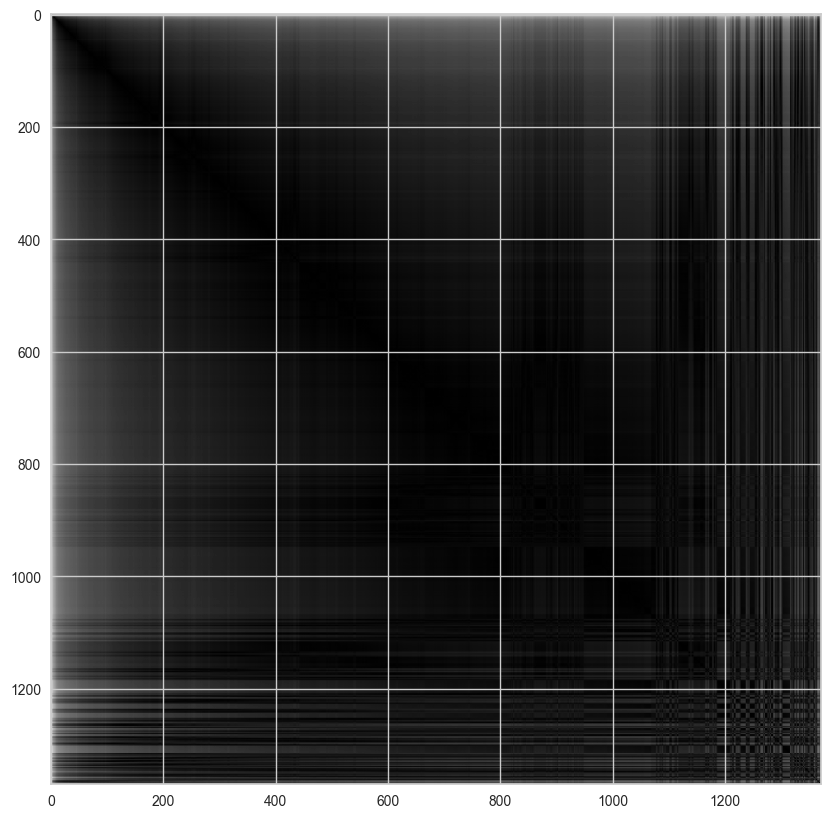

In [32]:
pyclustertend.vat(X)

*Para realizar clustering se importan las librerías requeridas*

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split

from kmodes.kprototypes import KPrototypes

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance
from kneed import KneeLocator

from sklearn.decomposition import PCA


from tqdm import tqdm
import sys
import warnings

De esta manera, se procede a calcular la generación de gráficos de codo para el algoritmo KMeans utilizando métricas de distorsión, silueta y calinski_harabasz.

  0%|          | 0/3 [00:00<?, ?it/s]

Elbow Score Plot (distortion metric):


  File "C:\Users\danar\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


elbow value = optimal k: 5  | elbow score: 899,272,419,548.418


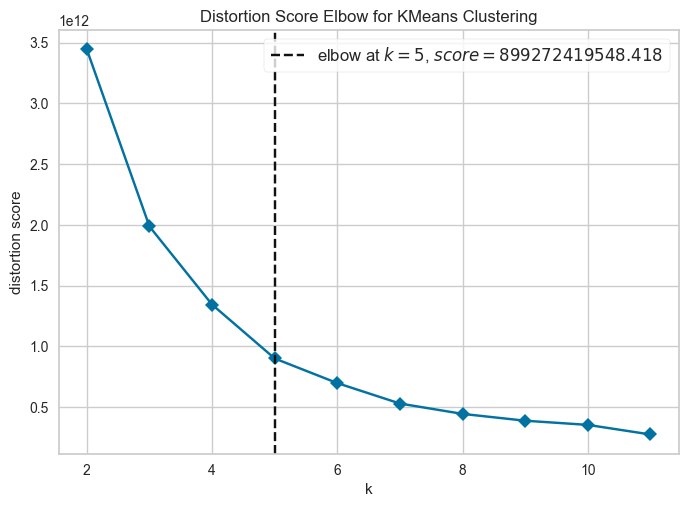

 33%|███▎      | 1/3 [00:02<00:05,  2.52s/it]

Elbow Score Plot (silhouette metric):
elbow value = optimal k: 2  | elbow score: 0.630


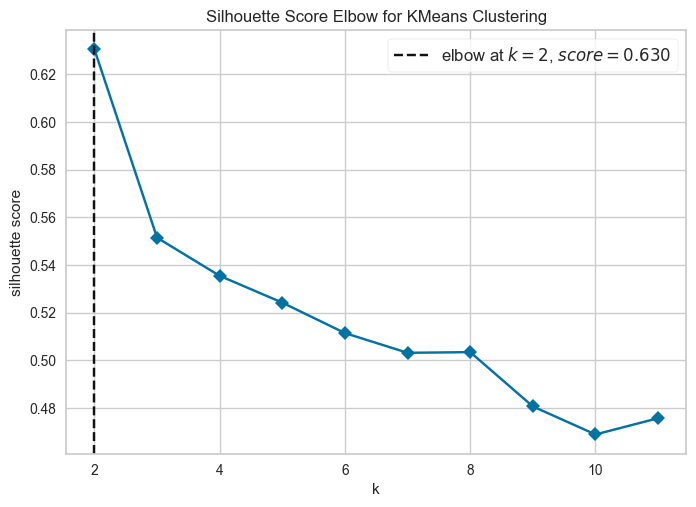

 67%|██████▋   | 2/3 [00:06<00:03,  3.15s/it]

Elbow Score Plot (calinski_harabasz metric):
elbow value = optimal k: 7  | elbow score: 3,504.459


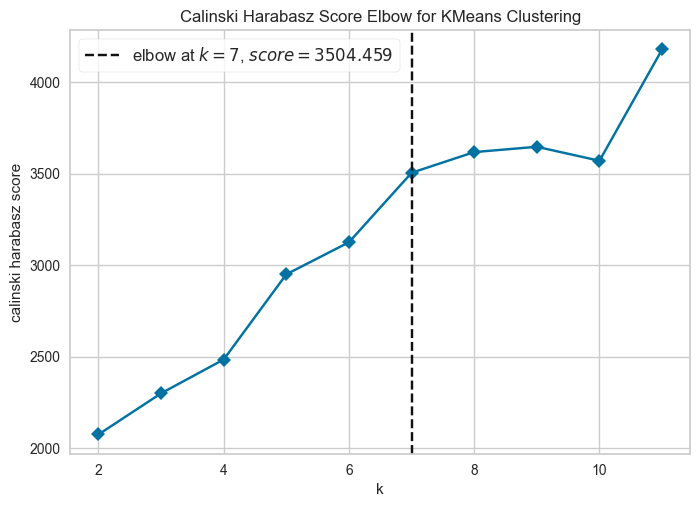

100%|██████████| 3/3 [00:07<00:00,  2.37s/it]


In [34]:
# get it from https://towardsdatascience.com/elbows-and-silhouettes-hands-on-customer-segmentation-in-python-66c2e794c552
warnings.filterwarnings("ignore")
# elbow score plot with Yellowbrick
nK = 12    
RNDN = 42    
def elbowplot(df2, elbowmetric, model):
    print("Elbow Score Plot (" + str(elbowmetric) + " metric):")
    vis = KElbowVisualizer(
        model, 
        k=(2,nK), 
        metric=elbowmetric,
        locate_elbow=True, 
        timings=False)
    vis.fit(df2)      
    print("elbow value = optimal k:", f'{vis.elbow_value_:.0f}', \
            " | elbow score:", f'{vis.elbow_score_:,.3f}')
    vis.show()  
    
    
    
# call elbow plot for each of 3 alternative metrics
    # distortion = mean sum of squared distances to center
    # silhouette = mean ratio of intra-cluster and nearest-cluster distance
    # calinski = ratio of within to between cluster dispersion

model = KMeans(random_state=RNDN)
_ = [elbowplot(X, m, model) for m in tqdm(["distortion", "silhouette", "calinski_harabasz"])]  

De los resultados obtenidos se puede identificar que la cantidad de clusteres óptimos de acuerdo con las **métrica de distorsión** son **10**, de acuerdo a **las siluetas** son **2**  y con la métrica de **calinski_harabasz** son **2**. De esta manera se decide realizar el clustering con una cantidad de **2**.

In [35]:
km = cluster.KMeans(n_clusters=2).fit(X)
print (km)

KMeans(n_clusters=2)


 Para realizar clustering se calculan los centroides de los clústeres y se muestran después de realizar el ajuste de un modelo de KMeans.

In [36]:
centroides = km.cluster_centers_
print(centroides)

[[5.79292453e+01 1.33962264e+00 5.40509434e+01 9.38067075e+03
  1.00377358e+00 1.07547170e-01 1.36037736e+00 1.15094340e+00
  1.00094340e+00 1.56509434e+00 1.04811321e+00 1.07433962e+01
  1.41792453e+00 1.03584906e+00 1.48962264e+00 2.25471698e+00
  5.70943396e+00 5.63301887e+00 1.96687358e+03 1.98107358e+03
  1.21320755e+00 3.25660377e+00 3.61698113e+00 1.78301887e+00
  7.35490566e+01 1.14905660e+00 1.84056604e+00 1.78301887e+00
  1.73396226e+00 3.07641509e+00 3.85133962e+02 4.97783019e+01
  5.22659434e+02 9.57571698e+02 1.03773585e+00 2.00000000e+00
  1.06320755e+00 1.18584906e+00 1.07299528e+03 2.95534906e+02
  4.46981132e+00 1.37300000e+03 3.80188679e-01 6.60377358e-02
  1.45471698e+00 3.51886792e-01 2.81509434e+00 1.04905660e+00
  1.70849057e+00 6.18490566e+00 1.19528302e+00 5.15094340e-01
  1.78301887e+00 1.57264151e+00 1.97362453e+03 1.90000000e+00
  1.68962264e+00 4.46409434e+02 1.07735849e+00 1.08867925e+00
  1.10566038e+00 8.15235849e+01 3.66122642e+01 2.36396226e+01
  3.4169

Se asigna cada punto de datos al clúster más cercano y se almacenan estas asignaciones en la variable **sales**.

In [37]:
sales = km.predict(X)

El tamaño de la muestra al calcular el índice de Hopkins es:

In [38]:
len(X)

1371

Y las columnas de la muestra que se utilizan son:

In [39]:
print(len(df2.columns))
df2.columns

75


Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
    

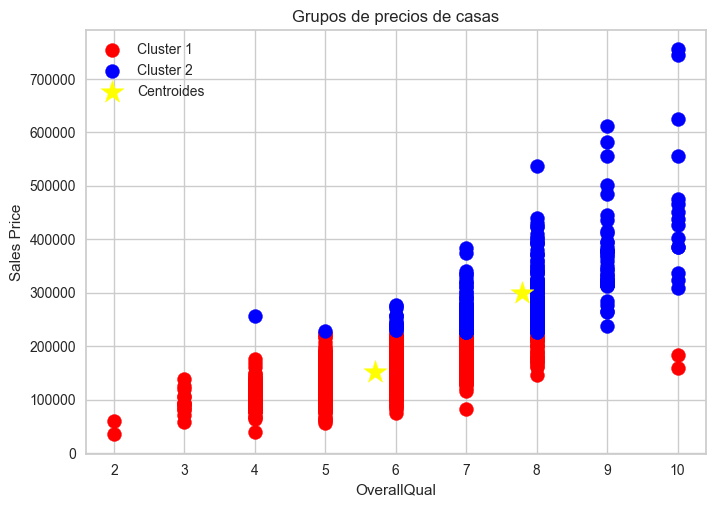

In [40]:
plt.scatter(X[sales == 0, 16], X[sales == 0, 74],s=100,c='red', label = "Cluster 1")
plt.scatter(X[sales == 1, 16], X[sales == 1, 74],s=100,c='blue', label = "Cluster 2")
plt.scatter(km.cluster_centers_[:,16],km.cluster_centers_[:,74], s=300, c="yellow",marker="*", label="Centroides")
plt.title("Grupos de precios de casas")
plt.xlabel("OverallQual")
plt.ylabel("Sales Price")
plt.legend()

Al realizar el agrupamiento se determinó utilizar la columna OverallQual debido a que en el mapa de calor de correlación de variables se identificó que existe una alta correlación entre estas variables. Al observar el resultado del clustering, se identificaron 2 grupos principales de los que se puede determinar que a medida que la valoración crece, el precio de la casa aumenta en ambos casos. Las casas con mayor valoración tienen precios más altos y las que tienen una menor valoración, precios más bajos. 

In [41]:
dataframe.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'Wo

### Regresión lineal
Posteriormente para hacer la predicción de la variable **salePrice** se decidió realizar el método de regresión lineal. Tomando en cuenta esto, primero se procedió a realizar la preparación de los datos separando la variable de respuesta del dataset.

In [42]:
y = df2.pop('SalePrice')
X = df2

In [43]:
ds = list(df2.columns)
ds

['MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 

Se realizó la separación entre el conjunto de datos prueba y de test de la siguiente manera:
- Test: 30%
- Train: 70%

In [44]:
X_train, X_test,y_train, y_test = train_test_split(X, y,test_size=0.3,train_size=0.7)

Se realiza el ajuste de regresión lineal simple utilizando la variable 'OverallQual' como predictor para predecir la variable objetivo (**salePrice**) además, se normalizan por separado los datos (de train y de test) para que todos tengan una escala similar.

In [45]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

p_length = y_train.values.reshape(-1, 1)
p_length_t = y_test.values.reshape(-1, 1)

overall_qual_index = X_train.columns.get_loc('OverallQual')

p_width = X_train_scaled[:, overall_qual_index].reshape(-1, 1)
p_width_t = X_test_scaled[:, overall_qual_index].reshape(-1, 1)

lm = LinearRegression()
lm.fit(p_width, p_length)

p_length_pred = lm.predict(p_width_t)

Para representar la ecuación se extraen los coeficientes y el intercepto del modelo y crea una cadena de texto que representa la ecuación de la recta de regresión.

In [46]:
#y = mx + c
m = lm.coef_[0][0]
c = lm.intercept_[0]

label = r'$p_length = %0.4f*p_width %+0.4f$'%(m,c)
print(label)

$p_length = 62036.3833*p_width +182160.8550$


Finalmente se representa gráficamente el modelo de regresión lineal simple calculado.

Text(0.5, 1.0, 'Test Set OverallQual vs SalePrice')

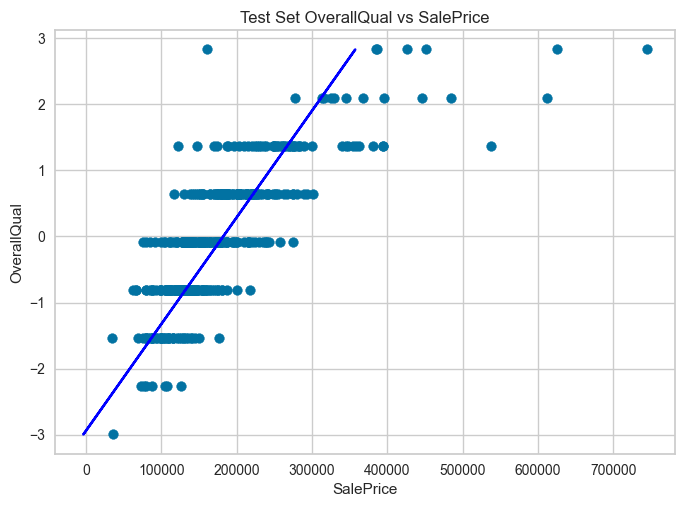

In [47]:
fig = plt.figure()
plt.scatter(p_length_t,p_width_t)
plt.plot(p_length_pred, p_width_t, color="blue")
plt.xlabel("SalePrice")
plt.ylabel("OverallQual")
plt.title("Test Set OverallQual vs SalePrice")

In [48]:
print("Mean Squared Error: %.2f"%mean_squared_error(p_length_t,p_length_pred))
print("R squared: %.2f"%r2_score(p_length_t,p_length_pred))

RMSE_dictModels['Linear Regression'] = np.sqrt(mean_squared_error(p_length_t,p_length_pred))

Mean Squared Error: 2692769906.72
R squared: 0.61


El $R^2$ explica el 67% de la variabilidad de los datos. Se debe mencionar que dentro de las pruebas realizadas en relación a las correlaciones obtenidas por el mapa de calor, es la variable que permitió obtener el mejor porcentaje. 

De esta manera, se procede a analizar los residuales encontrados.

In [49]:
residuales = p_length_t - p_length_pred
print("Residuales ",len(residuales))

Residuales  438


El valor positivo obtenido indica que en promedio, las predicciones son mayores que los valores reales por 438.

Text(0, 0.5, 'Residuales')

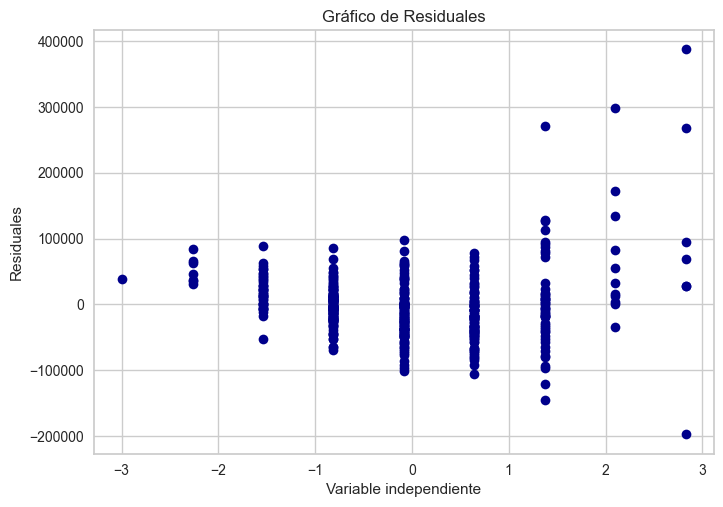

In [50]:
plt.plot(p_width_t,residuales, 'o', color='darkblue')
plt.title("Gráfico de Residuales")
plt.xlabel("Variable independiente")
plt.ylabel("Residuales")

De acuerdo con el gráfico de residuales se puede observar que los residuos parecen oscilares entre valores de -2 a 3 y estos parecen llegar a tomar una forma cuadrática por lo que indicaría que los residuos no necesariamente tienen una relación lineal. 

Text(0.5, 1.0, 'Residuales')

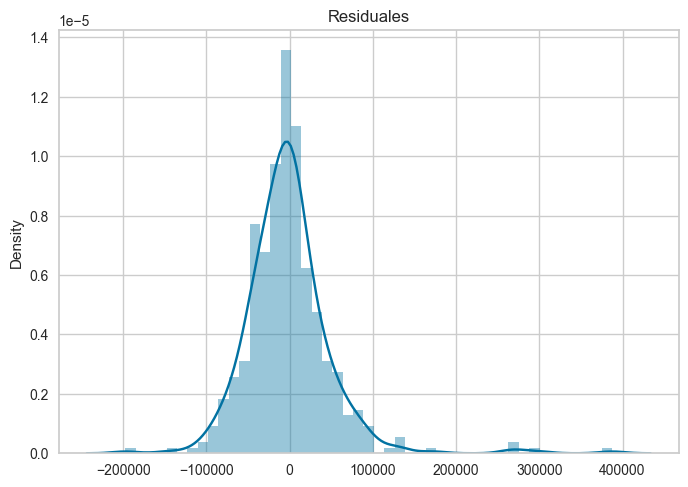

In [51]:
sns.distplot(residuales)
plt.title("Residuales")

De acuerdo con la gráfica los valores residuales siguen una distribución normal entre los rangos de -2 a 2 por lo que para ese grupo concreto podrían indicar una buena aproximación de los datos. 

{'whiskers': [<matplotlib.lines.Line2D at 0x22414c70ee0>,
 'caps': [<matplotlib.lines.Line2D at 0x22414c71960>,
 'boxes': [<matplotlib.lines.Line2D at 0x22414d99ab0>],
 'medians': [<matplotlib.lines.Line2D at 0x22414c72020>],
 'fliers': [<matplotlib.lines.Line2D at 0x22414c73310>],
 'means': []}

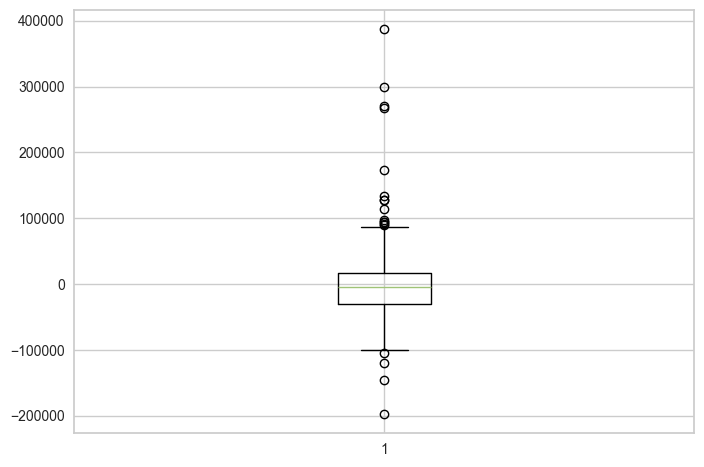

In [52]:
plt.boxplot(residuales)

El diagrama de caja y bigotes nos indica que los datos son simetricos de -1 a 1 y existen muchos valores atípicos de 1 a 3.

In [53]:
print(normaltest(residuales))

NormaltestResult(statistic=array([239.01682994]), pvalue=array([1.25358803e-52]))


Se realizó una prueba de normalidad para evalúar la hipótesis nula de la muestra. Debido a que el estadístico es de 82.82944419 (grande) y el valor de p 1.03232091e-18 (es muy pequeño) existe suficiente evidencia para rechazar la hipótesis nula (indicando que los datos no provienen necesariamente de una distribución normal).

0.6065510135257022

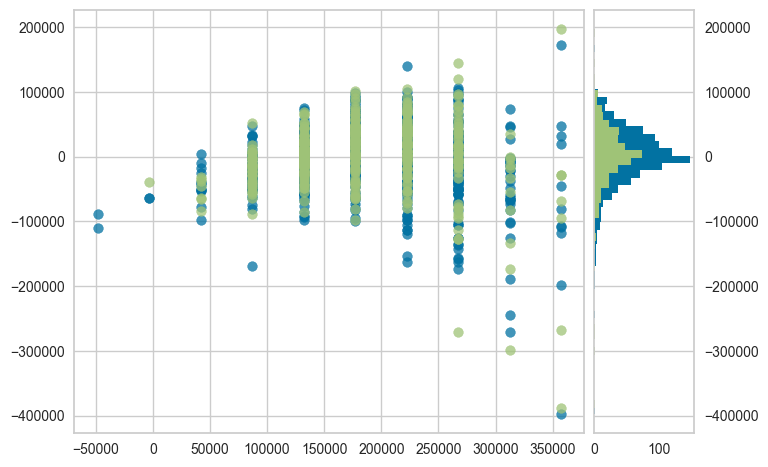

In [54]:

model = Ridge()
visualizer = ResidualsPlot(model)
visualizer.fit(p_width,p_length)
visualizer.score(p_width_t,p_length_t)


El gráfico parece indicar que existe cierta heterocedasticidad por la existencia de la forma cónica. De esta manera se interpreta que la varianza de los errores no es constante y puede cambiar a lo largo de las predicciones del modelo.  

In [55]:
est = sm.OLS(p_length,p_width)
est2 = est.fit()
print(est2.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.098
Model:                            OLS   Adj. R-squared (uncentered):              0.097
Method:                 Least Squares   F-statistic:                              110.9
Date:                Mon, 08 Apr 2024   Prob (F-statistic):                    1.10e-24
Time:                        16:11:17   Log-Likelihood:                         -13849.
No. Observations:                1021   AIC:                                  2.770e+04
Df Residuals:                    1020   BIC:                                  2.770e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

De acuerdo al resumen, el modelo tiene un $R^2$ relativamente bajo sugiriendo que este no explica completamente la variabilidad de los datos. De esta manera, se rechaza la hipósis nula de que OverallQual no es una buena variable predictoria del precio de ventas de las casas. 

### Regresion Lineal Multivariable

Se verifica entre todas las variables si existen valores NaN para evitar errores en la regresión

In [56]:
# Verificar qué columnas contienen valores NaN
columns_with_nan = df2.columns[df2.isna().any()].tolist()
print("Columnas con valores NaN:", columns_with_nan)


Columnas con valores NaN: ['MasVnrArea', 'GarageYrBlt']


Podemos ver que hay dos campos que cuentas con valores NaN, por lo que se procede a rellenar con la media, los campos NaN en Garage Built Year, y con 0 los campos en Masonry veneer area.

In [57]:
df_filled = df2.copy()

# Calcular la media de GarageYrBlt
garage_year_mean = df_filled['GarageYrBlt'].mean()

# Llenar NaN en GarageYrBlt con la media
df_filled['GarageYrBlt'].fillna(garage_year_mean, inplace=True)

# Llenar NaN en MasVnrArea con 0
df_filled['MasVnrArea'].fillna(0, inplace=True)

Ya con esos valores sustituidos, podemos realizar la primera gráfica de valores reales vs predicciones con todas las variables cuantitativas

Text(0, 0.5, 'Predicciones')

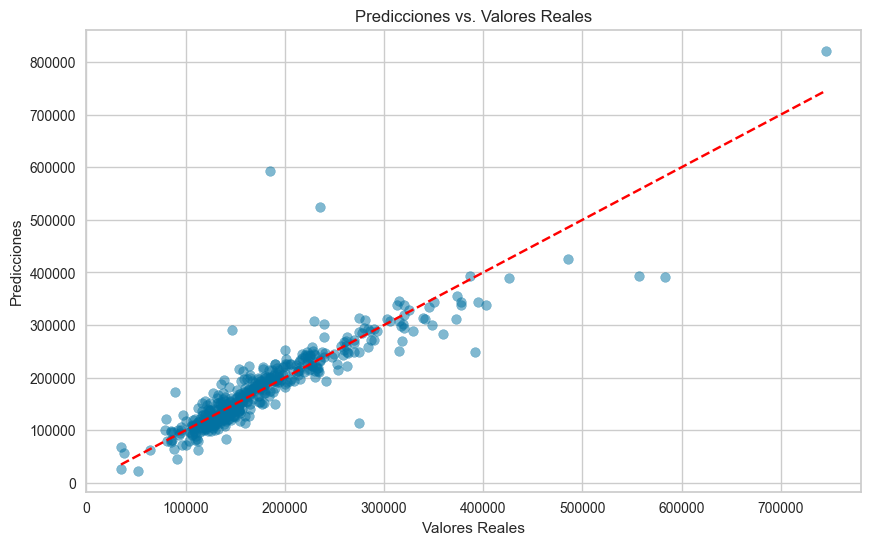

In [58]:
X2 = df_filled
X_train, X_test, y_train, y_test = train_test_split(X2, y, test_size=0.3, train_size=0.7)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lm = LinearRegression()
lm.fit(X_train_scaled, y_train)

y_pred = lm.predict(X_test_scaled)

# Graficar las predicciones versus los valores reales
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Predicciones vs. Valores Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')

In [59]:
# Análisis del modelo
print("Mean Squared Error: %.2f" % mean_squared_error(y_test, y_pred))
print("R squared: %.2f" % r2_score(y_test, y_pred))
RMSE_dictModels['Linear Regression Multivariable'] = np.sqrt(mean_squared_error(y_test, y_pred))

Mean Squared Error: 1345690564.56
R squared: 0.78


In [60]:
# Residuales
residuales = y_test - y_pred
print("Residuales:", len(residuales))



Residuales: 438


Text(0, 0.5, 'Residuales')

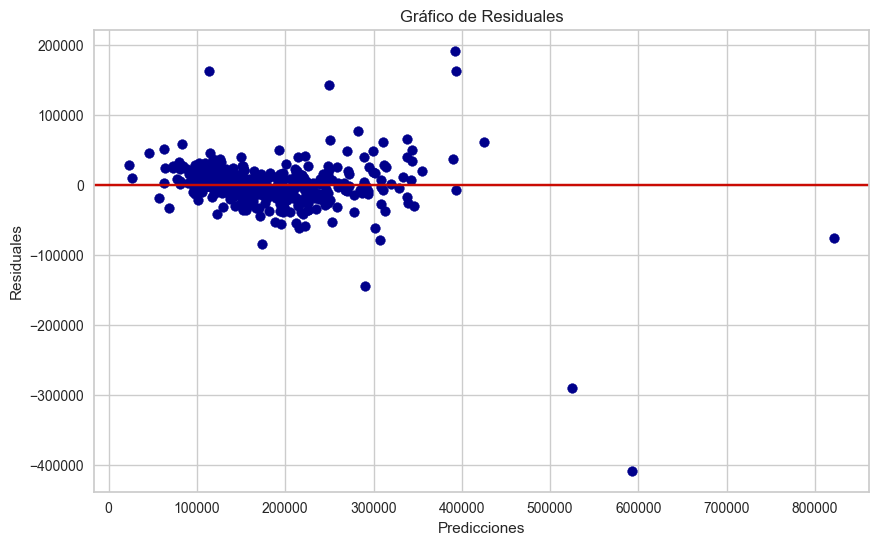

In [61]:
# Gráfico de Residuales
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuales, color='darkblue')
plt.axhline(y=0, color='r', linestyle='-')
plt.title("Gráfico de Residuales")
plt.xlabel("Predicciones")
plt.ylabel("Residuales")

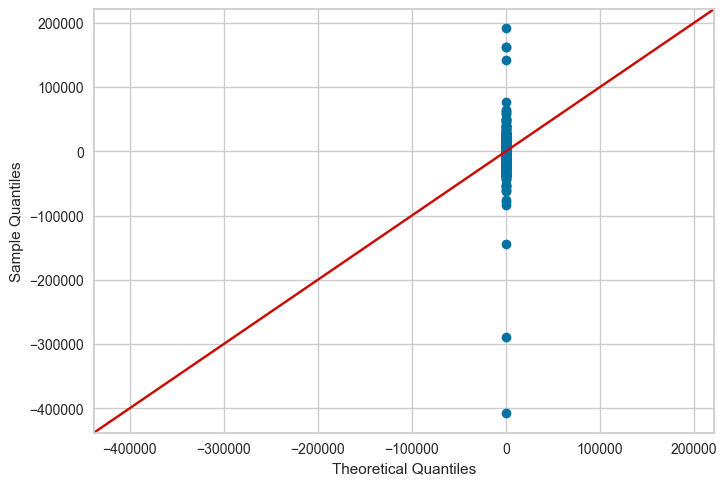

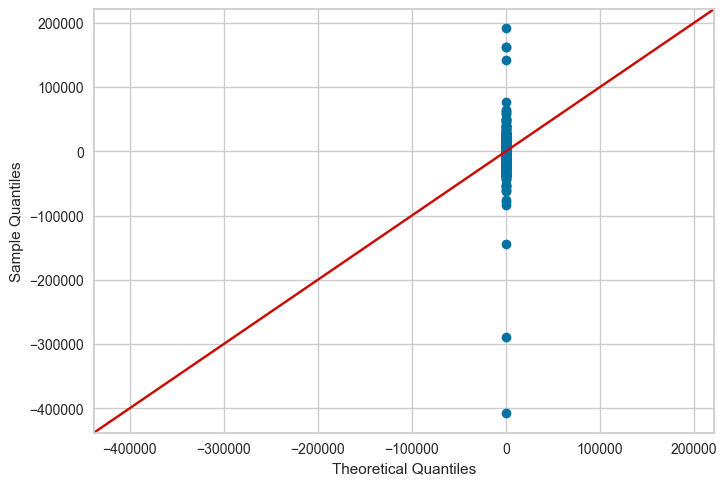

In [62]:
sm.qqplot(residuales,line='45')

In [63]:
k,p=sm.stats.diagnostic.lilliefors(residuales)
print("p =",p)

p = 0.0009999999999998899


El p-valor es menor que 0.05 por lo que se rechaza la hipótesis nula de normalidad de los datos.

Text(0.5, 1.0, 'Distribución de Residuales')

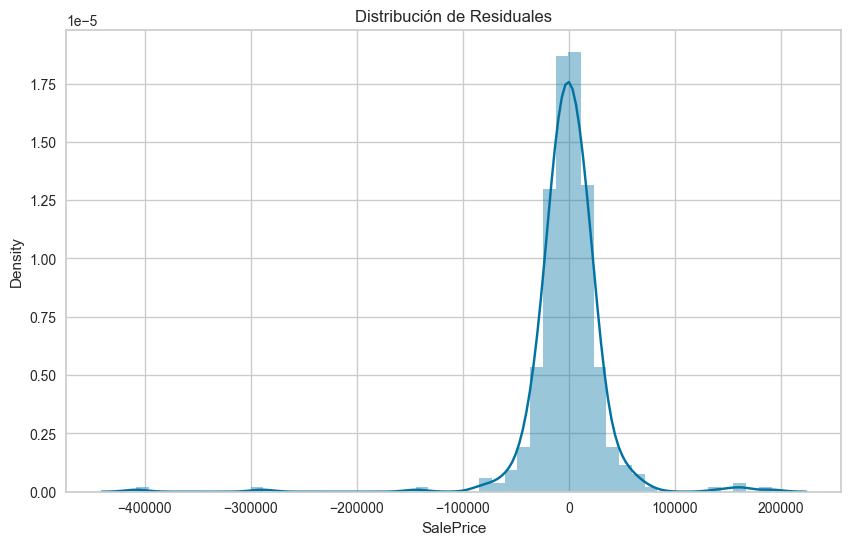

In [64]:
# Distribución de Residuales
plt.figure(figsize=(10, 6))
sns.distplot(residuales)
plt.title("Distribución de Residuales")

Podemos ver que los valores residuales siguen una distribución normal entre los rangos de -1 a 1.

Text(0, 0.5, 'Residuales')

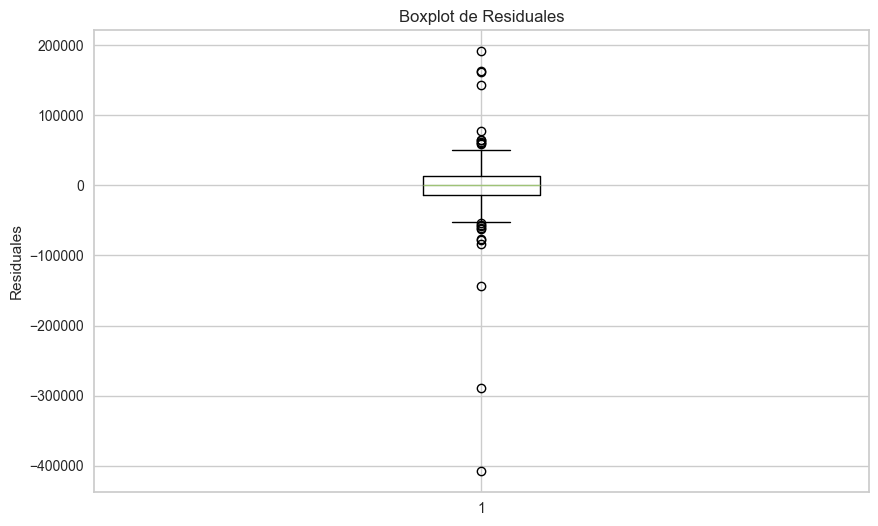

In [65]:
# Boxplot de Residuales
plt.figure(figsize=(10, 6))
plt.boxplot(residuales)
plt.title("Boxplot de Residuales")
plt.ylabel("Residuales")

El diagrama de caja y bigotes nos indica que los datos son simetricos entre un poco despué de -1 hasta hasta un poco antes 1. Y hay valores atípicos arriba de uno, y abajo de -1.

In [66]:
print(normaltest(residuales))

NormaltestResult(statistic=408.20148077503575, pvalue=2.2917893521889757e-89)


In [67]:
# Resumen del modelo
X_train_sm = sm.add_constant(X_train_scaled)
model = sm.OLS(y_train, X_train_scaled)
results = model.fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.143
Model:                            OLS   Adj. R-squared (uncentered):              0.079
Method:                 Least Squares   F-statistic:                              2.239
Date:                Mon, 08 Apr 2024   Prob (F-statistic):                    7.44e-08
Time:                        16:11:23   Log-Likelihood:                         -13823.
No. Observations:                1021   AIC:                                  2.779e+04
Df Residuals:                     950   BIC:                                  2.814e+04
Df Model:                          71                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

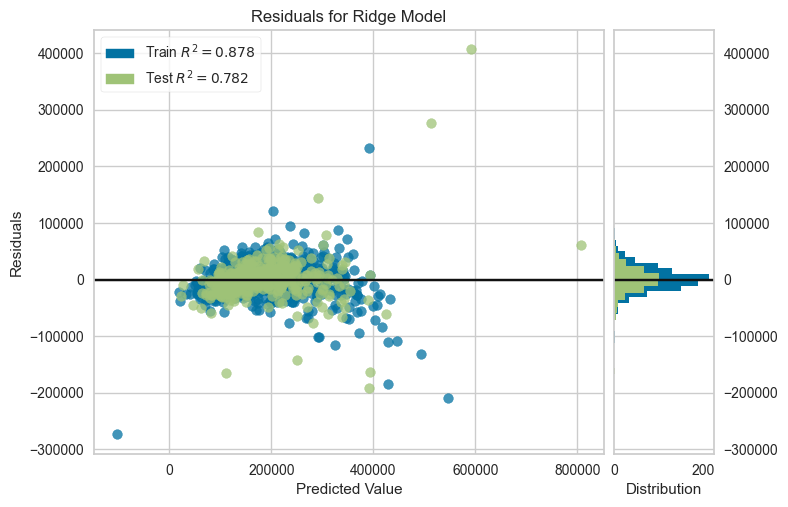

<Axes: title={'center': 'Residuals for Ridge Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [68]:
# Gráfico del modelo
model = Ridge()
visualizer = ResidualsPlot(model)
visualizer.fit(X_train_scaled, y_train)
visualizer.score(X_test_scaled, y_test)
visualizer.show()

### Multicolinealidad

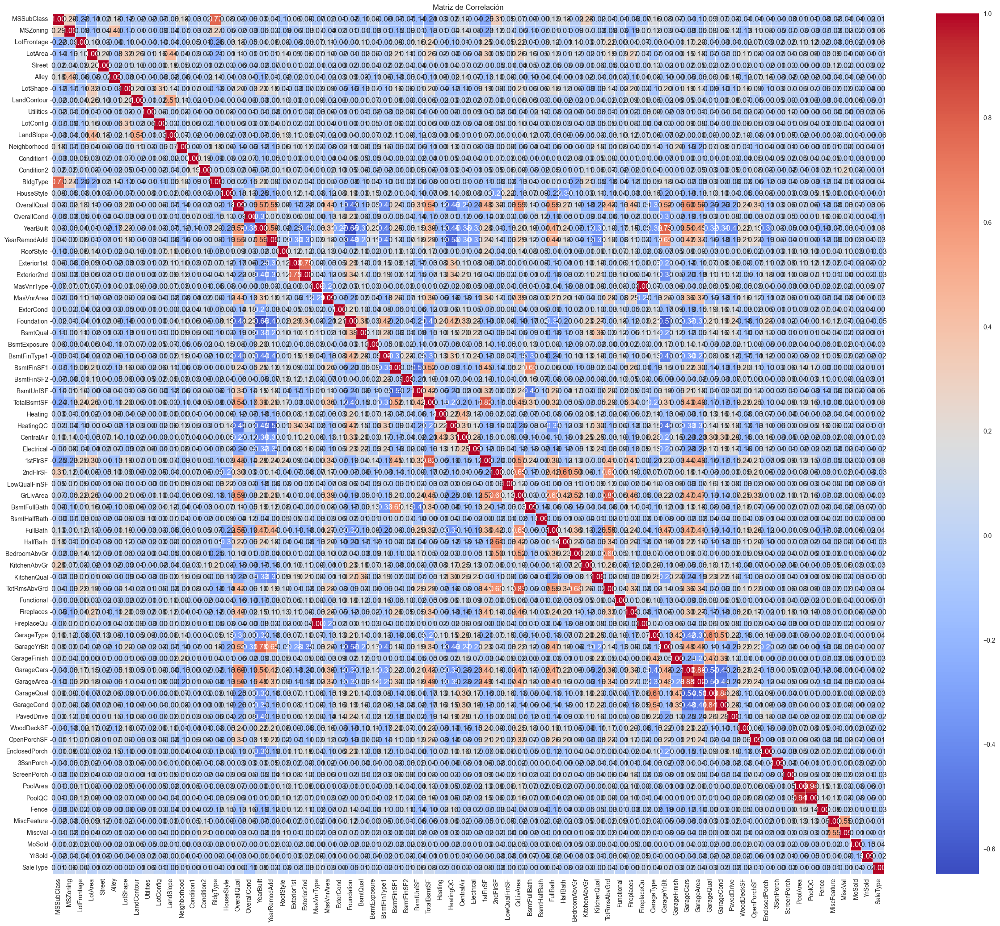

Correlación entre 'MasVnrType' y 'FireplaceQu': 1.0
Correlación entre 'TotalBsmtSF' y '1stFlrSF': 0.8195299750050339
Correlación entre 'GrLivArea' y 'TotRmsAbvGrd': 0.8254893743088425
Correlación entre 'GarageCars' y 'GarageArea': 0.882475414281462
Correlación entre 'GarageQual' y 'GarageCond': 0.8383959090159379
Correlación entre 'PoolArea' y 'PoolQC': 0.9384016221034003


In [69]:
# Calcular la matriz de correlación
correlation_matrix = df_filled.corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(30, 25))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlación')
plt.show()

# Definir un umbral de correlación
threshold = 0.8  # Por ejemplo, consideraremos como alta correlación valores absolutos mayores de 0.8

# Crear una función para imprimir pares de características con correlación alta
def print_high_correlation(correlation_matrix, threshold):
    n_features = correlation_matrix.shape[0]
    for i in range(n_features):
        for j in range(i+1, n_features):
            if abs(correlation_matrix.iloc[i, j]) > threshold:
                print(f"Correlación entre '{correlation_matrix.index[i]}' y '{correlation_matrix.columns[j]}': {correlation_matrix.iloc[i, j]}")

# Llamar a la función con la matriz de correlación y el umbral definido
print_high_correlation(correlation_matrix, threshold)

En la matriz de correlación podemos ver que tenemos bastantes variables con alta correlacion, representadas con color rojo. Las variables más relacionadas entre si son 'MasVnrType' y 'FireplaceQu' con una correlación de 1.0, perfecta basicamente, y también 'PoolArea' y 'PoolQC' con una correlación de 0.94., la cual es bastante alta. Por ello se podria decir que si puede llegar a existir multicolinealidad en el modelo.

En cuanto a la adaptación del modelo a los datos, la alta correlación entre algunas características puede afectar la estabilidad del modelo de regresión lineal. Esto se debe a que la multicolinealidad puede inflar los errores estándar de los coeficientes y hacer que la interpretación de los mismos sea menos confiableAcá logramos obtener las correlaciones mayores a 0.5 entre la variable respuesta con el resto de variables. Podemos notar que no tienen alta correlación por lo que no hay multicolinealidad

### Sobreajuste

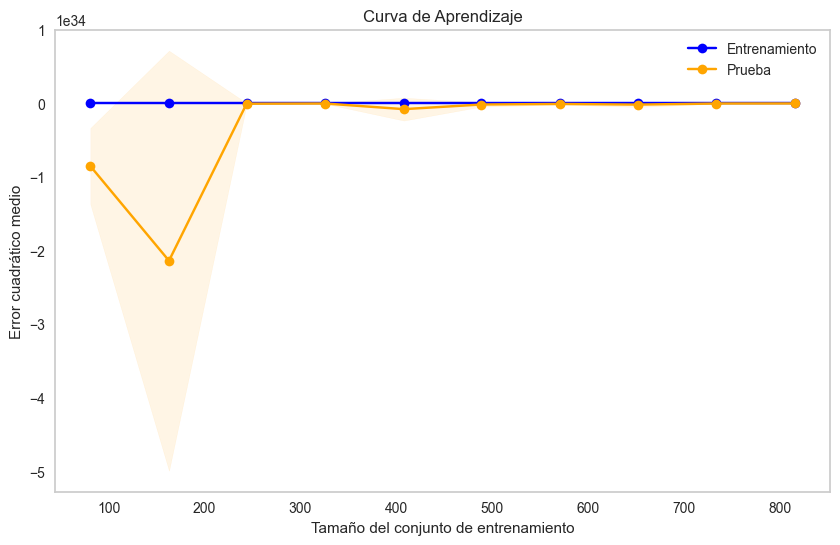

R-cuadrado en los datos de prueba: 0.7779558871238577
MSE en los datos de prueba: 1345690564.5565417
R-cuadrado en los datos de entrenamiento: 0.877532464677153
MSE en los datos de entrenamiento: 785994266.3005366


In [70]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, X, y):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10), scoring='neg_mean_squared_error')
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="blue")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1,
                     color="orange")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="blue", label="Entrenamiento")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="orange", label="Prueba")
    plt.xlabel("Tamaño del conjunto de entrenamiento")
    plt.ylabel("Error cuadrático medio")
    plt.title("Curva de Aprendizaje")
    plt.legend(loc="best")
    plt.grid()
    plt.show()

# Utiliza la función plot_learning_curve con tu modelo y datos
plot_learning_curve(lm, X_train_scaled, y_train)

# Evaluar el rendimiento del modelo en los datos de entrenamiento y prueba
train_score = lm.score(X_train_scaled, y_train)
test_score = lm.score(X_test_scaled, y_test)
train_mse = mean_squared_error(y_train, lm.predict(X_train_scaled))
test_mse = mean_squared_error(y_test, lm.predict(X_test_scaled))

print("R-cuadrado en los datos de prueba:", test_score)
print("MSE en los datos de prueba:", test_mse)
print("R-cuadrado en los datos de entrenamiento:", train_score)
print("MSE en los datos de entrenamiento:", train_mse)


Para el sobreajuste podemos notar que el error tanto en los datos de prueba como de entrenamiento son relativamente bajos (Entrenamiento: 0.13, Prueba: 0.19). En la gráfica podemos notar que el error en un par de tamaños de conjuntos de datos crece, pero ya conforme este tamaño va aumentando el error va disminuyendo entre ambos. Por lo que se puede concluir que no esta sobreajustado.

In [71]:
x_pred_modelo1 = lm.predict(X_train_scaled)
mse_modelo1_train = mean_squared_error(y_train, x_pred_modelo1) 

print("MES_train: ",round(mse_modelo1_train,4))
print('MSE_test: ', round(test_mse,4))

MES_train:  785994266.3005
MSE_test:  1345690564.5565


In [72]:
# calculate aic for regression 
def calculate_aic(n, mse, num_params):
 aic = n * np.log(mse) + 2 * num_params
 return aic
# calculate bic for regression
def calculate_bic(n, mse, num_params):
 bic = n * np.log(mse) + num_params * np.log(n)
 return bic

In [73]:
# Regression metrics
explained_variance_modelo1=metrics.explained_variance_score(y_test, y_pred)
mean_absolute_error_modelo1=metrics.mean_absolute_error(y_test, y_pred) 
mse_modelo1=metrics.mean_squared_error(y_test, y_pred) 
mean_squared_log_error_modelo1=metrics.mean_squared_log_error(abs(y_test), abs(y_pred))
median_absolute_error_modelo1=metrics.median_absolute_error(y_test, y_pred)
r2_modelo1=metrics.r2_score(y_test, y_pred)
k = lm.coef_.size
n = X_train.shape[0]
aic_modelo1 = calculate_aic(n,mse_modelo1,k)
bic_modelo1 = calculate_bic(n,mse_modelo1,k)

print('explained_variance: ', round(explained_variance_modelo1,4))   
print('mean_squared_log_error: ', round(mean_squared_log_error_modelo1,4))
print('r2: ', round(r2_modelo1,4))
print('MAE: ', round(mean_absolute_error_modelo1,4))
print('MSE: ', round(mse_modelo1,4))
print('RMSE: ', round(np.sqrt(mse_modelo1),4))
print('AIC: ',round(aic_modelo1,4))
print('BIC: ',round(bic_modelo1,4))

RMSE_dictModels['Linear Regression Multivariable learning_curve'] = round(np.sqrt(mse_modelo1),4)

explained_variance:  0.7781
mean_squared_log_error:  0.0296
r2:  0.778
MAE:  19771.3648
MSE:  1345690564.5565
RMSE:  36683.6553
AIC:  21609.5968
BIC:  21974.3086


## Selección de predictores. Stepwise

In [74]:
# Crea un modelo de seleccion de predicrores stepwise backward, con un k-fold de 5 en la validación cruzada
from sklearn.feature_selection import SequentialFeatureSelector

seleccionPredictores = SequentialFeatureSelector(lm, direction='backward', cv=5)
seleccionPredictores.fit(X_train, y_train)

# Extrae los índices de los predictores
indicePredictores= seleccionPredictores.get_support(indices=True)

# Variables seleccionadas
columnas = X_train.columns

print("Predictores:   ")

for i in indicePredictores:
    print(columnas[i])

Predictores:   
MSSubClass
LotArea
Alley
Utilities
Neighborhood
Condition1
Condition2
HouseStyle
OverallQual
OverallCond
Exterior1st
MasVnrType
MasVnrArea
Foundation
BsmtQual
BsmtFinType1
BsmtFinSF1
BsmtFinSF2
BsmtUnfSF
TotalBsmtSF
HeatingQC
LowQualFinSF
GrLivArea
BsmtFullBath
FullBath
BedroomAbvGr
KitchenAbvGr
KitchenQual
FireplaceQu
GarageFinish
GarageCars
GarageQual
GarageCond
WoodDeckSF
ScreenPorch
MiscFeature
SaleType


In [75]:
X_train_stw= X_train.iloc[:,indicePredictores]
X_test_stw = X_test.iloc[:,indicePredictores]

In [76]:
# Train a linear regression model on the training set with the selected features
modelo2 = LinearRegression()
modelo2.fit(X_train_stw, y_train)

# Predict the target values on the testing set
y_pred_modelo2 = modelo2.predict(X_test_stw)

Text(0, 0.5, 'Residuales')

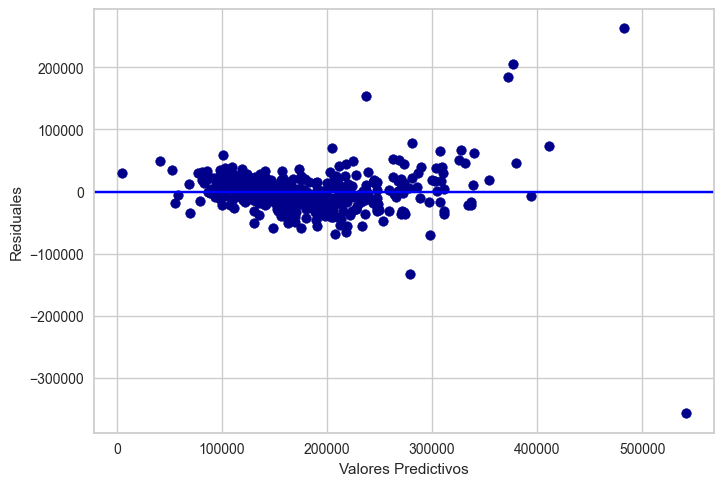

In [77]:
resid_modelo2=y_test-y_pred_modelo2
plt.scatter(y_pred_modelo2, resid_modelo2, color='darkblue')
plt.axhline(0,color='blue')
plt.xlabel('Valores Predictivos')
plt.ylabel('Residuales')

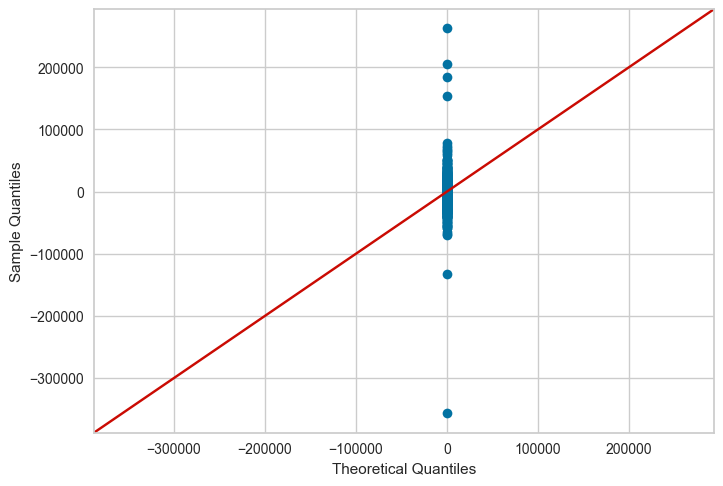

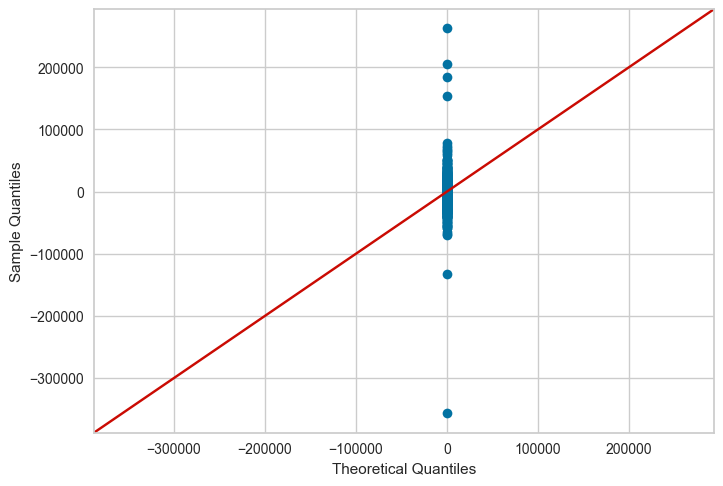

In [78]:
sm.qqplot(resid_modelo2,line='45')

In [79]:
k,p=sm.stats.diagnostic.lilliefors(resid_modelo2)
print("p =",p)

p = 0.0009999999999998899


In [80]:
# Evaluar el rendimiento del modelo en los datos de entrenamiento y prueba
train_score = modelo2.score(X_train_stw, y_train)
test_score = modelo2.score(X_test_stw, y_test)
train_mse = mean_squared_error(y_train, modelo2.predict(X_train_stw))
test_mse = mean_squared_error(y_test, modelo2.predict(X_test_stw))

print("R-cuadrado en los datos de prueba:", test_score)
print("MSE en los datos de prueba:", test_mse)
print("R-cuadrado en los datos de entrenamiento:", train_score)
print("MSE en los datos de entrenamiento:", train_mse)

R-cuadrado en los datos de prueba: 0.7912635474792356
MSE en los datos de prueba: 1265039955.3393347
R-cuadrado en los datos de entrenamiento: 0.8378103014344871
MSE en los datos de entrenamiento: 1040930339.5340185


In [81]:
x_pred_modelo2 = modelo2.predict(X_train_stw)
mse_modelo2_train=metrics.mean_squared_error(y_train, x_pred_modelo2) 

print("MES_train: ",round(mse_modelo2_train,4))
print('MSE_test: ', round(test_mse,4))

MES_train:  1040930339.534
MSE_test:  1265039955.3393


In [82]:
# Regression metrics
explained_variance_modelo2=metrics.explained_variance_score(y_test, y_pred_modelo2)
mean_absolute_error_modelo2=metrics.mean_absolute_error(y_test, y_pred_modelo2) 
mse_modelo2=metrics.mean_squared_error(y_test, y_pred_modelo2) 
mean_squared_log_error_modelo2=metrics.mean_squared_log_error(abs(y_test), abs(y_pred_modelo2))
median_absolute_error_modelo2=metrics.median_absolute_error(y_test, y_pred_modelo2)
r2_modelo2=metrics.r2_score(y_test, y_pred_modelo2)
k = modelo2.coef_.size
n = X_train.shape[0]
aic_modelo2 = calculate_aic(n,mse_modelo2,k)
bic_modelo2 = calculate_bic(n,mse_modelo2,k)

print('explained_variance: ', round(explained_variance_modelo2,4))   
print('mean_squared_log_error: ', round(mean_squared_log_error_modelo2,4))
print('r2: ', round(r2_modelo2,4))
print('MAE: ', round(mean_absolute_error_modelo2,4))
print('MSE: ', round(mse_modelo2,4))
print('RMSE: ', round(np.sqrt(mse_modelo2),4))
print('AIC: ',round(aic_modelo2,4))
print('BIC: ',round(bic_modelo2,4))

RMSE_dictModels['Linear Regression Multivariable predictores'] = round(np.sqrt(mse_modelo2),4)

explained_variance:  0.7913
mean_squared_log_error:  0.0364
r2:  0.7913
MAE:  21078.491
MSE:  1265039955.3393
RMSE:  35567.4002
AIC:  21472.4953
BIC:  21654.8512


### Ridge

In [83]:
from sklearn.model_selection import ShuffleSplit
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import RidgeCV, Ridge
from sklearn.model_selection import cross_validate


alphas = np.logspace(-2, 0, num=20)
ridge = make_pipeline(StandardScaler(),
                      RidgeCV(alphas=alphas, store_cv_values=True))


cv = ShuffleSplit(n_splits=5, random_state=1)
cv_results = cross_validate(ridge, X_train, y_train,
                            cv=cv, scoring="neg_mean_squared_error",
                            return_train_score=True,
                            return_estimator=True, n_jobs=2)
train_error = -cv_results["train_score"]
print(f"Error medio cuadrado de la regresión con datos de entrenamiento:\n"
      f"{train_error.mean():.3f} ± {train_error.std():.3f}")

test_error = -cv_results["test_score"]
print(f"Error medio cuadrado de la regresion con los datos de prueba:\n"
      f"{test_error.mean():.3f} ± {test_error.std():.3f}")
mse_alphas = [est[-1].cv_values_.mean(axis=0)
            for est in cv_results["estimator"]]
cv_alphas = pd.DataFrame(mse_alphas, columns=alphas)
cv_alphas

Error medio cuadrado de la regresión con datos de entrenamiento:
753625083.387 ± 59894851.051
Error medio cuadrado de la regresion con los datos de prueba:
1519159080.741 ± 1188130730.573


,0.010000,0.012743,0.016238,0.020691,0.026367,0.033598,0.042813,0.054556,0.069519,0.088587,0.112884,0.143845,0.183298,0.233572,0.297635,0.379269,0.483293,0.615848,0.784760,1.000000
0,1.945220e+09,1.944882e+09,1.944452e+09,1.943905e+09,1.943209e+09,1.942325e+09,1.941202e+09,1.939779e+09,1.937975e+09,1.935695e+09,1.932816e+09,1.929193e+09,1.924647e+09,1.918967e+09,1.911906e+09,1.903184e+09,1.892499e+09,1.879537e+09,1.864002e+09,1.845658e+09
1,6.433357e+09,6.418146e+09,6.398863e+09,6.374455e+09,6.343612e+09,6.304729e+09,6.255850e+09,6.194630e+09,6.118302e+09,6.023687e+09,5.907247e+09,5.765233e+09,5.593948e+09,5.390175e+09,5.151778e+09,4.878454e+09,4.572550e+09,4.239745e+09,3.889331e+09,3.533810e+09
2,1.291205e+09,1.291304e+09,1.291429e+09,1.291587e+09,1.291788e+09,1.292042e+09,1.292362e+09,1.292765e+09,1.293271e+09,1.293903e+09,1.294688e+09,1.295658e+09,1.296846e+09,1.298286e+09,1.300009e+09,1.302042e+09,1.304396e+09,1.307066e+09,1.310024e+09,1.313225e+09
3,1.968367e+09,1.968023e+09,1.967584e+09,1.967026e+09,1.966317e+09,1.965416e+09,1.964272e+09,1.962821e+09,1.960982e+09,1.958658e+09,1.955724e+09,1.952030e+09,1.947396e+09,1.941605e+09,1.934406e+09,1.925514e+09,1.914618e+09,1.901399e+09,1.885555e+09,1.866842e+09
4,2.084976e+09,2.084597e+09,2.084116e+09,2.083504e+09,2.082725e+09,2.081736e+09,2.080480e+09,2.078888e+09,2.076871e+09,2.074321e+09,2.071103e+09,2.067053e+09,2.061973e+09,2.055629e+09,2.047746e+09,2.038016e+09,2.026105e+09,2.011671e+09,1.994396e+09,1.974031e+09


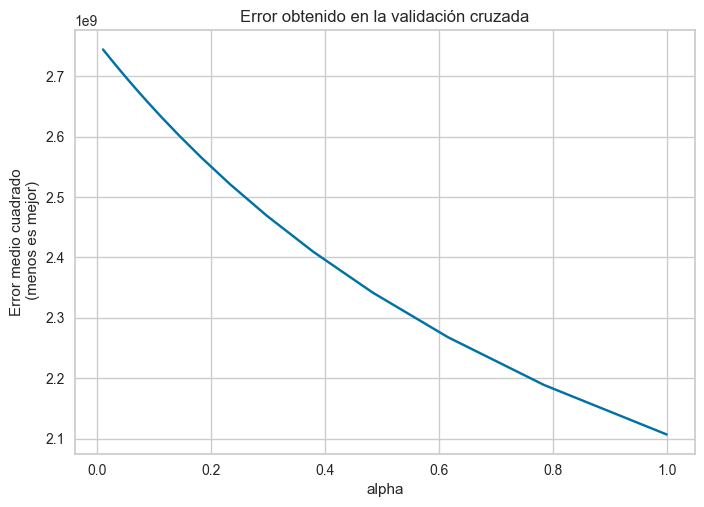

In [84]:
cv_alphas.mean(axis=0).plot(marker="+")
plt.ylabel("Error medio cuadrado\n (menos es mejor)")
plt.xlabel("alpha")
_ = plt.title("Error obtenido en la validación cruzada")

In [85]:
mejores_alphas = [est[-1].alpha_ for est in cv_results["estimator"]]
mejores_alphas
print(f"El mejor alfa es:\n"
      f"{np.mean(mejores_alphas):.2f} ± {np.std(mejores_alphas):.2f}")

El mejor alfa es:
0.80 ± 0.40


In [86]:
alfa_modelo3 = np.mean(mejores_alphas)
modelo3 = Ridge(alpha=alfa_modelo3)
modelo3.fit(X_train, y_train)

# Predict the target values on the testing set
y_pred_modelo3 = modelo3.predict(X_test)

In [87]:
# Evaluar el rendimiento del modelo en los datos de entrenamiento y prueba
train_score = modelo3.score(X_train, y_train)
test_score = modelo3.score(X_test, y_test)
train_mse = mean_squared_error(y_train, modelo3.predict(X_train))
test_mse = mean_squared_error(y_test, y_pred_modelo3)

print("R-cuadrado en los datos de prueba:", test_score)
print("MSE en los datos de prueba:", test_mse)
print("R-cuadrado en los datos de entrenamiento:", train_score)
print("MSE en los datos de entrenamiento:", train_mse)

R-cuadrado en los datos de prueba: 0.800172630497233
MSE en los datos de prueba: 1211046769.92731
R-cuadrado en los datos de entrenamiento: 0.8749273888329069
MSE en los datos de entrenamiento: 802713592.5404063


In [88]:
# Regression metrics
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_log_error


explained_variance_modelo3=explained_variance_score(y_test, y_pred_modelo3)
mean_absolute_error_modelo3= mean_absolute_error(y_test, y_pred_modelo3) 
mse_modelo3=metrics.mean_squared_error(y_test, y_pred_modelo3) 
mean_squared_log_error_modelo3=mean_squared_log_error(abs(y_test), abs(y_pred_modelo3))
r2_modelo3=metrics.r2_score(y_test, y_pred_modelo3)
k = modelo3.coef_.size
n = X_train.shape[0]
aic_modelo3 = calculate_aic(n,mse_modelo3,k)
bic_modelo3 = calculate_bic(n,mse_modelo3,k)

print('explained_variance: ', round(explained_variance_modelo3,4))   
print('mean_squared_log_error: ', round(mean_squared_log_error_modelo3,4))
print('r2: ', round(r2_modelo3,4))
print('MAE: ', round(mean_absolute_error_modelo3,4))
print('MSE: ', round(mse_modelo3,4))
print('RMSE: ', round(np.sqrt(mse_modelo3),4))
print('AIC: ',round(aic_modelo3,4))
print('BIC: ',round(bic_modelo3,4))

RMSE_dictModels['Ridge Regression'] = round(np.sqrt(mse_modelo3),4)

explained_variance:  0.8002
mean_squared_log_error:  0.0292
r2:  0.8002
MAE:  19627.0251
MSE:  1211046769.9273
RMSE:  34800.0973
AIC:  21501.9607
BIC:  21866.6725


In [89]:
from sklearn.linear_model import LassoCV


lasso = make_pipeline(StandardScaler(), LassoCV(alphas = np.arange(0,1,0.02), cv=cv, n_jobs = 2))
cv_results_lasso = cross_validate(lasso, X_train, y_train,
                            cv=cv, scoring="neg_mean_squared_error",
                            return_train_score=True,
                            return_estimator=True, n_jobs=2)
train_error = -cv_results_lasso["train_score"]
print(f"Error medio cuadrado de la regresión con datos de entrenamiento:\n"
      f"{train_error.mean():.3f} ± {train_error.std():.3f}")

test_error_lasso = -cv_results_lasso["test_score"]
print(f"Error medio cuadrado de la regresion con los datos de prueba:\n"
      f"{test_error.mean():.3f} ± {test_error.std():.3f}")
alphas = []
for est in cv_results_lasso["estimator"]:
    alphas.append(est[1].alpha_)
print
print(alphas)
-cv_results_lasso["test_score"]

Error medio cuadrado de la regresión con datos de entrenamiento:
753507715.803 ± 59839571.810
Error medio cuadrado de la regresion con los datos de prueba:
1519159080.741 ± 1188130730.573
[0.98, 0.98, 0.98, 0.98, 0.98]


array([1.18458184e+09, 8.19137726e+08, 3.85800390e+09, 1.10690594e+09,
       6.09910246e+08])

In [90]:
from sklearn.linear_model import Lasso


modelo4 = Lasso(alpha=0.06)
modelo4.fit(X_train, y_train)

# Predict the target values on the testing set
y_pred_modelo4 = modelo4.predict(X_test)

In [91]:
# Evaluar el rendimiento del modelo en los datos de entrenamiento y prueba
train_score = modelo4.score(X_train, y_train)
test_score = modelo4.score(X_test, y_test)
train_mse = mean_squared_error(y_train, modelo4.predict(X_train))
test_mse = mean_squared_error(y_test, y_pred_modelo4)

print("R-cuadrado en los datos de prueba:", test_score)
print("MSE en los datos de prueba:", test_mse)
print("R-cuadrado en los datos de entrenamiento:", train_score)
print("MSE en los datos de entrenamiento:", train_mse)

R-cuadrado en los datos de prueba: 0.7780119810368382
MSE en los datos de prueba: 1345350609.362733
R-cuadrado en los datos de entrenamiento: 0.8775348008300308
MSE en los datos de entrenamiento: 785979272.9166796


In [92]:
# Regression metrics
from sklearn.metrics import explained_variance_score, mean_absolute_error, mean_squared_log_error

explained_variance_modelo4=explained_variance_score(y_test, y_pred_modelo4)
mean_absolute_error_modelo4= mean_absolute_error(y_test, y_pred_modelo4) 
mse_modelo4=metrics.mean_squared_error(y_test, y_pred_modelo4) 
mean_squared_log_error_modelo4=mean_squared_log_error(abs(y_test), abs(y_pred_modelo4))
r2_modelo4=metrics.r2_score(y_test, y_pred_modelo4)
k = modelo3.coef_.size
n = X_train.shape[0]
aic_modelo4 = calculate_aic(n,mse_modelo4,k)
bic_modelo4 = calculate_bic(n,mse_modelo4,k)

print('explained_variance: ', round(explained_variance_modelo3,4))   
print('mean_squared_log_error: ', round(mean_squared_log_error_modelo3,4))
print('r2: ', round(r2_modelo4,4))
print('MAE: ', round(mean_absolute_error_modelo4,4))
print('MSE: ', round(mse_modelo4,4))
print('RMSE: ', round(np.sqrt(mse_modelo4),4))
print('AIC: ',round(aic_modelo4,4))
print('BIC: ',round(bic_modelo4,4))

RMSE_dictModels['Lasso Regression'] = round(np.sqrt(mse_modelo4),4)

explained_variance:  0.8002
mean_squared_log_error:  0.0292
r2:  0.778
MAE:  19764.4834
MSE:  1345350609.3627
RMSE:  36679.0214
AIC:  21609.3388
BIC:  21974.0506


# Naive Bayes

In [93]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import random
import statsmodels.api as sm
import statsmodels.stats.diagnostic as smd
import pandas as pd
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
import statsmodels.stats.diagnostic as diag
from sklearn.naive_bayes import GaussianNB
#Metrics
from sklearn.metrics import make_scorer, accuracy_score,precision_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score ,precision_score,recall_score,f1_score

# Arboles de decisión

In [94]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import export_text, plot_tree
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor  # Asegúrate de importar DecisionTreeRegressor



------------------Decision Tree Algorithm----------------------------



R^2 en el conjunto de prueba: 0.7014892417432343
Error Cuadrático Medio del conjunto de prueba (MSE): 2289674892.18417
|--- OverallQual <= 6.50
|   |--- value: [142077.64]
|--- OverallQual >  6.50
|   |--- PoolQC <= 1.50
|   |   |--- GarageArea <= 664.50
|   |   |   |--- value: [214442.63]
|   |   |--- GarageArea >  664.50
|   |   |   |--- BsmtQual <= 2.50
|   |   |   |   |--- value: [272982.62]
|   |   |   |--- BsmtQual >  2.50
|   |   |   |   |--- 2ndFlrSF <= 1420.50
|   |   |   |   |   |--- value: [354253.10]
|   |   |   |   |--- 2ndFlrSF >  1420.50
|   |   |   |   |   |--- Neighborhood <= 10.00
|   |   |   |   |   |   |--- value: [625000.00]
|   |   |   |   |   |--- Neighborhood >  10.00
|   |   |   |   |   |   |--- HouseStyle <= 3.00
|   |   |   |   |   |   |   |--- value: [184750.00]
|   |   |   |   |   |   |--- HouseStyle >  3.00
|   |   |   |   |   |   |   |--- value: [198500.00]
|   |--- PoolQC >  1.50
|   |   |--- Neighborhood <= 5.50
|   |   |   |--- value: [745000.00]
|   |

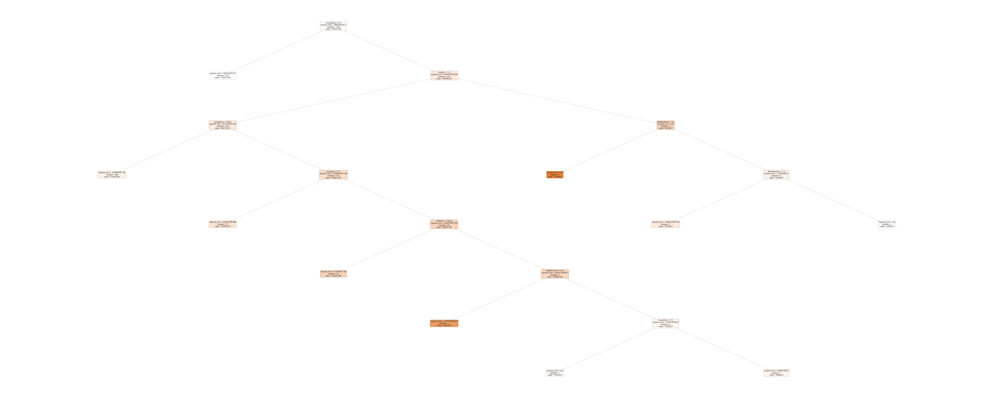


------------------Random Forest Algorithm----------------------------

R^2 en el conjunto de prueba: 0.7545240340834701
Error Cuadrático Medio del conjunto de prueba (MSE): 1882880734.6041327


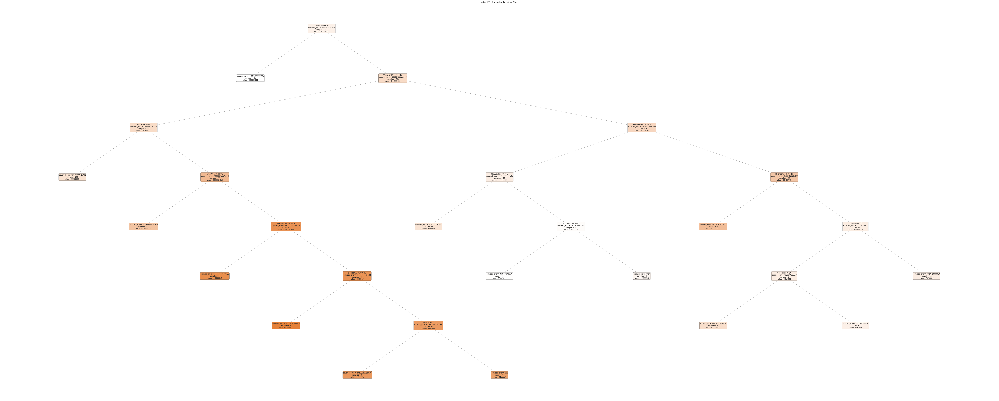

In [95]:
# Divide los datos en conjuntos de entrenamiento y prueba

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


numberTree = 0
#GridSearchCV
def profundidades(X_train, y_train, profundidad, X):
    global numberTree
    # Crea un modelo de árbol de regresión
    if len(profundidad)>0:
        for prof in profundidad:
            modelo_arbol = DecisionTreeRegressor(max_depth=prof)
            
            # Entrena el modelo
            modelo_arbol.fit(X_train, y_train)
            # Realiza predicciones en el conjunto de prueba
            predicciones = modelo_arbol.predict(X_test)
            # Evalúa el rendimiento del modelo utilizando el error cuadrático medio (MSE)
            r2Test = r2_score(y_test, predicciones)
            mseTest = mean_squared_error(y_test, predicciones)
            print(f'R^2 en el conjunto de prueba: {r2Test}')
            print(f'Error Cuadrático Medio del conjunto de prueba (MSE): {mseTest}')
            # Evaluar el rendimiento del modelo en los datos de entrenamiento y prueba


            RMSE_dictModels['Tree Decision'+str(numberTree)] = np.sqrt(mean_squared_error(y_test, predicciones))
            numberTree +=1

            # Visualiza el árbol de regresión (puedes ajustar la profundidad máxima según tus necesidades)
            tree_rules = export_text(modelo_arbol, feature_names=list(X.columns))
            print(tree_rules)
            # Visualiza el árbol de regresión en una imagen (opcional)
            plt.figure(figsize=(100, 40))
            plot_tree(modelo_arbol, filled=True, feature_names=list(X.columns), rounded=True, fontsize=10)
            plt.show()
    else:
        modelo_arbol = DecisionTreeRegressor()
        # Entrena el modelo
        modelo_arbol.fit(X_train, y_train)
        # Realiza predicciones en el conjunto de prueba
        predicciones = modelo_arbol.predict(X_test)
        # Evalúa el rendimiento del modelo utilizando el error cuadrático medio (MSE)
        r2Test = r2_score(y_test, predicciones)
        mseTest = mean_squared_error(y_test, predicciones)
        print(f'R^2 en el conjunto de prueba: {r2Test}')
        print(f'Error Cuadrático Medio del conjunto de prueba (MSE): {mseTest}')

        RMSE_dictModels['Tree Decision'+str(numberTree)] = np.sqrt(mseTest)
        numberTree+=1

        # Visualiza el árbol de regresión (puedes ajustar la profundidad máxima según tus necesidades)
        tree_rules = export_text(modelo_arbol, feature_names=list(X.columns))
        print(tree_rules)
        # Visualiza el árbol de regresión en una imagen (opcional)
        plt.figure(figsize=(100, 40))
        plot_tree(modelo_arbol, filled=True, feature_names=list(X.columns), rounded=True, fontsize=10)
        plt.show()

def visualizarRandomForest(X_train, y_train, profundidad, X):
    global numberTree
    # Dividir los datos en conjuntos de entrenamiento y prueba
    # Crea un modelo de Random Forest para regresión
    if len(profundidad) > 0:
        for prof in profundidad:
            modelo_random_forest = RandomForestRegressor(n_estimators=100, max_depth=prof, random_state=42)
            # Entrena el modelo
            modelo_random_forest.fit(X_train, y_train)
            # Realiza predicciones en el conjunto de prueba
            predicciones = modelo_random_forest.predict(X_test)
            # Evalúa el rendimiento del modelo utilizando el error cuadrático medio (MSE)
            r2Test = r2_score(y_test, predicciones)
            mseTest = mean_squared_error(y_test, predicciones)
            print(f'R^2 en el conjunto de prueba: {r2Test}')
            print(f'Error Cuadrático Medio del conjunto de prueba (MSE): {mseTest}')

            RMSE_dictModels['Tree Random Forest'] = np.sqrt(mseTest)

            ultimo_arbol = modelo_random_forest.estimators_[-1]
            plt.figure(figsize=(100, 40))
            plot_tree(ultimo_arbol, filled=True, feature_names=list(X.columns), rounded=True, fontsize=10)
            plt.title(f'Árbol {100} - Profundidad máxima: {prof}')
            plt.show()
    else:
        modelo_random_forest = RandomForestRegressor(n_estimators=100, random_state=42)
        # Entrena el modelo
        modelo_random_forest.fit(X_train, y_train)
        # Realiza predicciones en el conjunto de prueba
        predicciones = modelo_random_forest.predict(X_test)
        # Evalúa el rendimiento del modelo utilizando el error cuadrático medio (MSE)
        r2Test = r2_score(y_test, predicciones)
        mseTest = mean_squared_error(y_test, predicciones)
        print(f'R^2 en el conjunto de prueba: {r2Test}')
        print(f'Error Cuadrático Medio del conjunto de prueba (MSE): {mseTest}')

        RMSE_dictModels['Tree Random Forest'] = np.sqrt(mseTest)

        ultimo_arbol = modelo_random_forest.estimators_[-1]
        plt.figure(figsize=(100, 40))
        plot_tree(ultimo_arbol, filled=True, feature_names=list(X.columns), rounded=True, fontsize=10)
        plt.title(f'Árbol {100} - Profundidad máxima: {modelo_random_forest.get_params()["max_depth"]}')
        plt.show()

print("\n------------------Decision Tree Algorithm----------------------------\n")
profundidades(X_train, y_train, [], X)
print("\n------------------Random Forest Algorithm----------------------------\n")
visualizarRandomForest(X_train, y_train, profundidad=[], X=X)


3. Profundidades


------------------Decision Tree Algorithm----------------------------

R^2 en el conjunto de prueba: 0.5990348206959972
Error Cuadrático Medio del conjunto de prueba (MSE): 3075533722.984977
|--- OverallQual <= 7.50
|   |--- OverallQual <= 6.50
|   |   |--- value: [142077.64]
|   |--- OverallQual >  6.50
|   |   |--- value: [206157.83]
|--- OverallQual >  7.50
|   |--- WoodDeckSF <= 193.00
|   |   |--- value: [292178.12]
|   |--- WoodDeckSF >  193.00
|   |   |--- value: [322609.10]



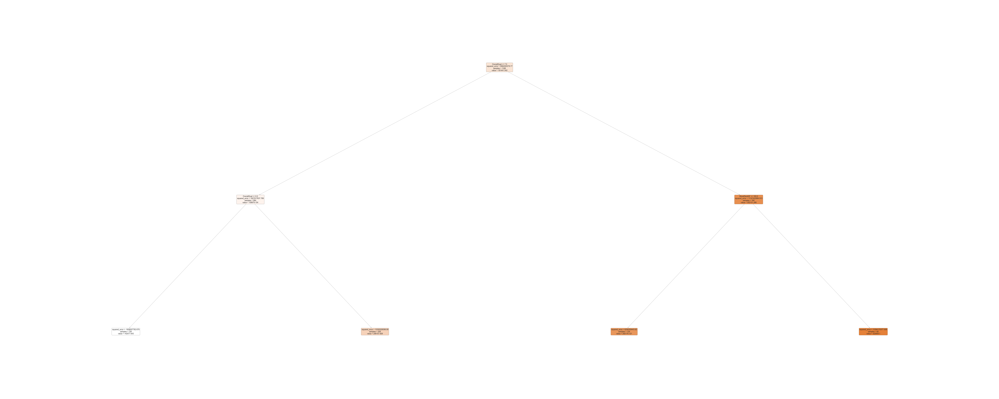

R^2 en el conjunto de prueba: 0.5710307178254552
Error Cuadrático Medio del conjunto de prueba (MSE): 3290334327.1416593
|--- OverallQual <= 7.50
|   |--- value: [158879.15]
|--- OverallQual >  7.50
|   |--- Alley <= 0.50
|   |   |--- GrLivArea <= 1973.00
|   |   |   |--- value: [268573.77]
|   |   |--- GrLivArea >  1973.00
|   |   |   |--- 2ndFlrSF <= 1564.50
|   |   |   |   |--- value: [342121.44]
|   |   |   |--- 2ndFlrSF >  1564.50
|   |   |   |   |--- value: [636000.00]
|   |--- Alley >  0.50
|   |   |--- BldgType <= 3.00
|   |   |   |--- value: [150333.33]
|   |   |--- BldgType >  3.00
|   |   |   |--- value: [174000.00]



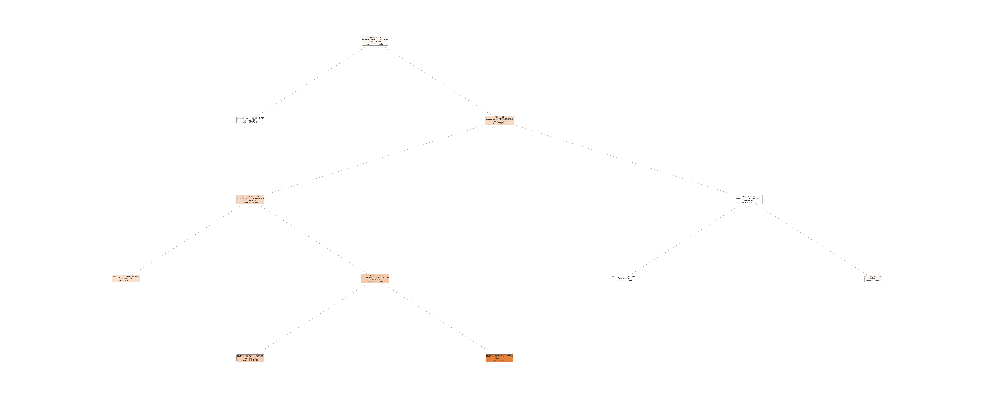

R^2 en el conjunto de prueba: 0.6340052243349904
Error Cuadrático Medio del conjunto de prueba (MSE): 2807299319.4768963
|--- OverallQual <= 6.50
|   |--- value: [142077.64]
|--- OverallQual >  6.50
|   |--- GarageType <= 1.50
|   |   |--- 1stFlrSF <= 1685.00
|   |   |   |--- value: [225723.41]
|   |   |--- 1stFlrSF >  1685.00
|   |   |   |--- BsmtFinSF1 <= 1225.00
|   |   |   |   |--- value: [282051.50]
|   |   |   |--- BsmtFinSF1 >  1225.00
|   |   |   |   |--- LandContour <= 1.50
|   |   |   |   |   |--- value: [390118.59]
|   |   |   |   |--- LandContour >  1.50
|   |   |   |   |   |--- value: [341487.67]
|   |--- GarageType >  1.50
|   |   |--- GrLivArea <= 2089.00
|   |   |   |--- value: [182618.60]
|   |   |--- GrLivArea >  2089.00
|   |   |   |--- EnclosedPorch <= 10.00
|   |   |   |   |--- GarageArea <= 692.50
|   |   |   |   |   |--- value: [283271.12]
|   |   |   |   |--- GarageArea >  692.50
|   |   |   |   |   |--- value: [385738.39]
|   |   |   |--- EnclosedPorch >  10.00

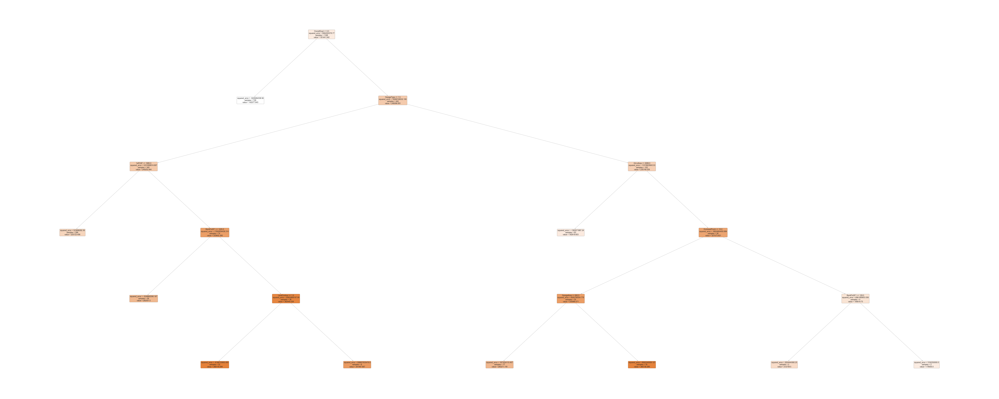

R^2 en el conjunto de prueba: 0.6864547624431603
Error Cuadrático Medio del conjunto de prueba (MSE): 2404994252.7709403
|--- OverallQual <= 6.50
|   |--- value: [142077.64]
|--- OverallQual >  6.50
|   |--- GarageCars <= 2.50
|   |   |--- value: [215382.62]
|   |--- GarageCars >  2.50
|   |   |--- GrLivArea <= 2657.00
|   |   |   |--- value: [297681.94]
|   |   |--- GrLivArea >  2657.00
|   |   |   |--- MoSold <= 8.50
|   |   |   |   |--- value: [471650.54]
|   |   |   |--- MoSold >  8.50
|   |   |   |   |--- GrLivArea <= 2704.50
|   |   |   |   |   |--- value: [383970.00]
|   |   |   |   |--- GrLivArea >  2704.50
|   |   |   |   |   |--- BsmtFinSF1 <= 1795.00
|   |   |   |   |   |   |--- value: [446261.00]
|   |   |   |   |   |--- BsmtFinSF1 >  1795.00
|   |   |   |   |   |   |--- value: [184750.00]



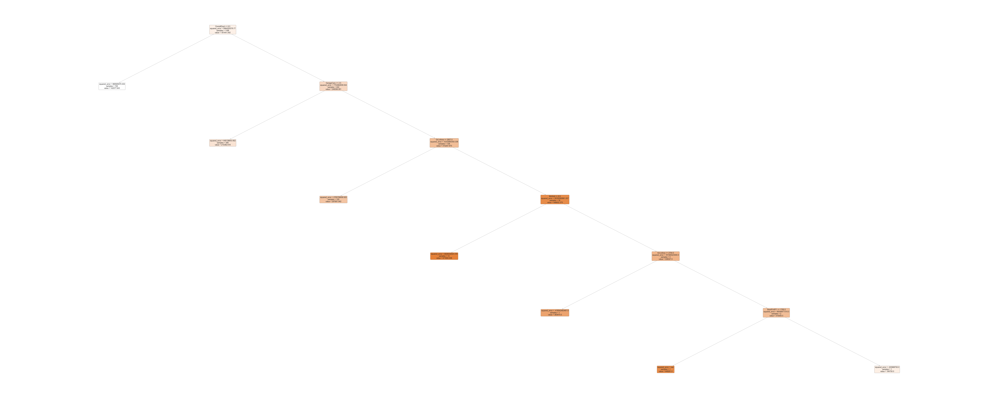


------------------Random Forest Algorithm----------------------------

R^2 en el conjunto de prueba: 0.6035153790135408
Error Cuadrático Medio del conjunto de prueba (MSE): 3041166379.0990925


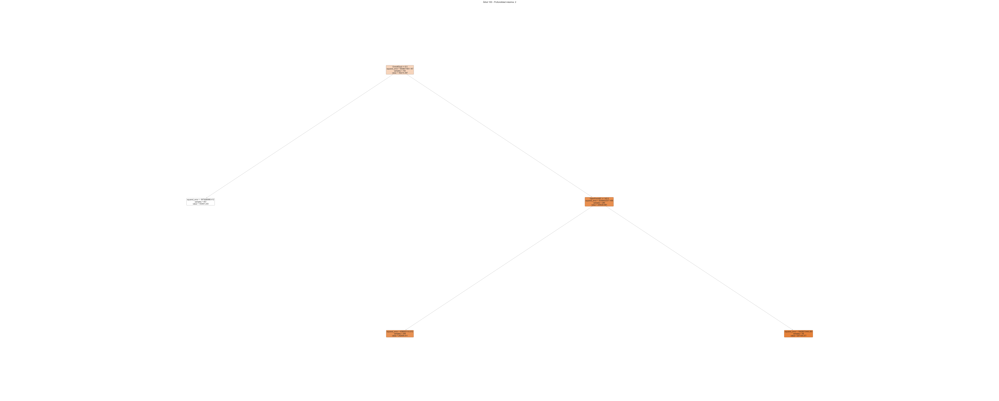

R^2 en el conjunto de prueba: 0.7419456859277813
Error Cuadrático Medio del conjunto de prueba (MSE): 1979360768.1058366


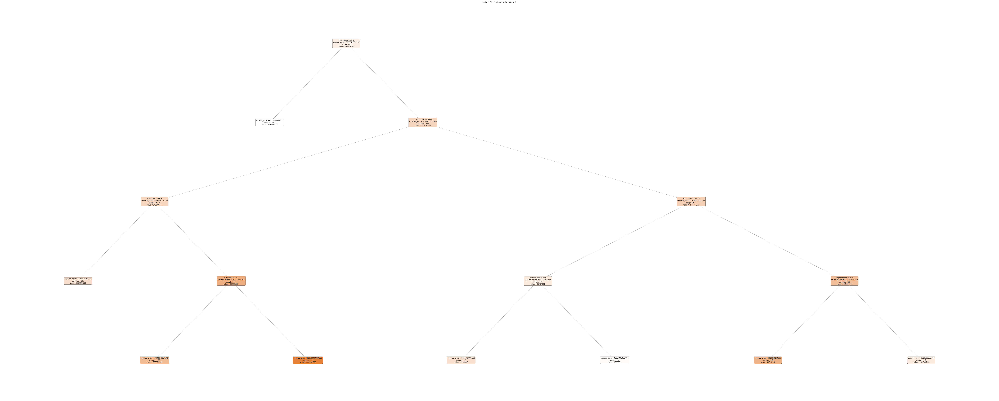

R^2 en el conjunto de prueba: 0.7551371805406617
Error Cuadrático Medio del conjunto de prueba (MSE): 1878177701.2646918


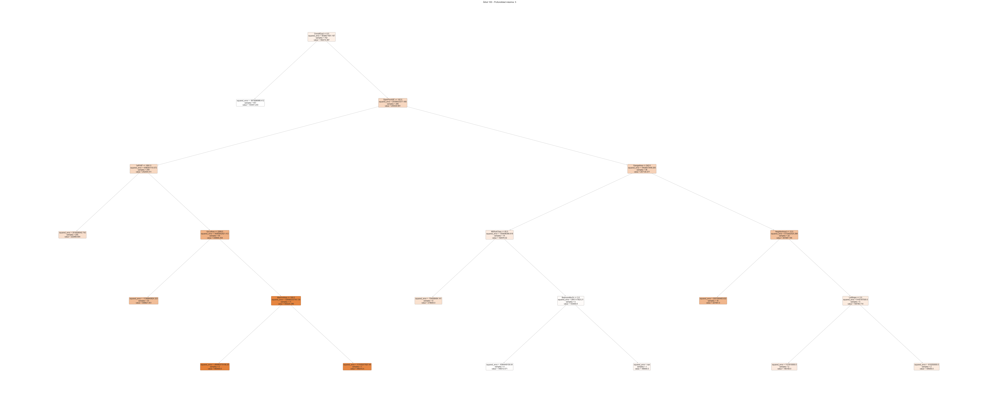

R^2 en el conjunto de prueba: 0.7596090001730801
Error Cuadrático Medio del conjunto de prueba (MSE): 1843877385.9443393


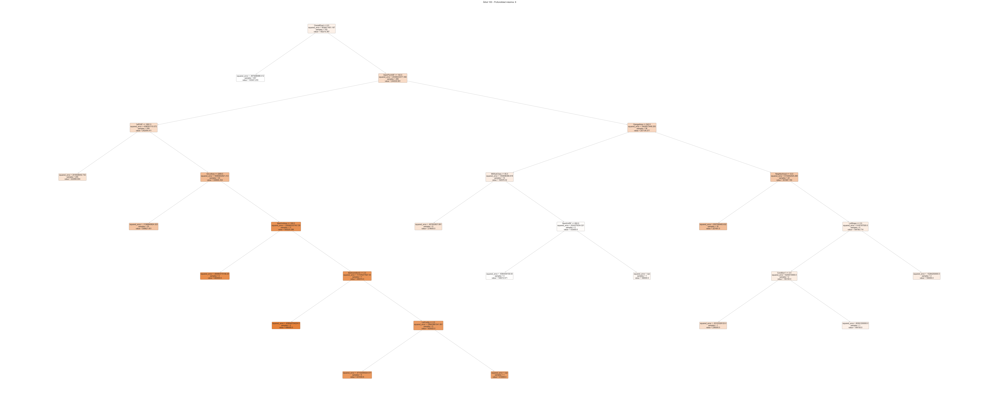

In [96]:
print("\n------------------Decision Tree Algorithm----------------------------\n")
profundidades(X_train, y_train, [2,4,5,8], X)
print("\n------------------Random Forest Algorithm----------------------------\n")
visualizarRandomForest(X_train, y_train, profundidad=[2,4,5,8], X=X)


4. R2 o rmse

1 y 2. Creando el modelo

In [97]:
"""accuracy=accuracy_score(y_test,y_pred)
precision =precision_score(y_test, y_pred,average='micro')
recall =  recall_score(y_test, y_pred,average='micro')
f1 = f1_score(y_test,y_pred,average='micro')
print('Confusion matrix for Naive Bayes\n',cm)
print('Accuracy: ',accuracy)"""

"accuracy=accuracy_score(y_test,y_pred)\nprecision =precision_score(y_test, y_pred,average='micro')\nrecall =  recall_score(y_test, y_pred,average='micro')\nf1 = f1_score(y_test,y_pred,average='micro')\nprint('Confusion matrix for Naive Bayes\n',cm)\nprint('Accuracy: ',accuracy)"

Determinar mejor profundidad

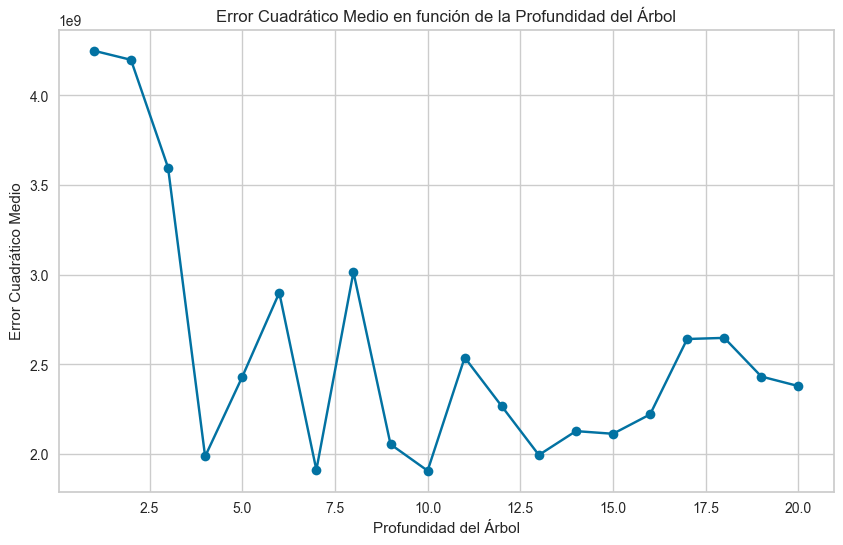

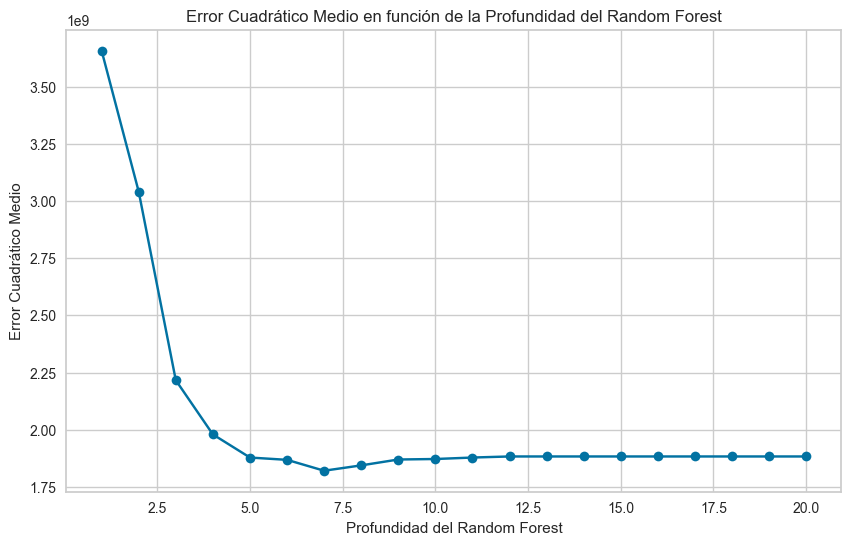

In [98]:
def graphErrorByDepthDecisionTree(X_train, y_train, X_test, y_test, profundidades):
    errores = []
    for prof in profundidades:
        modelo_arbol = DecisionTreeRegressor(max_depth=prof)
        modelo_arbol.fit(X_train, y_train)
        predicciones = modelo_arbol.predict(X_test)
        mse = mean_squared_error(y_test, predicciones)
        errores.append(mse)

    plt.figure(figsize=(10, 6))
    plt.plot(profundidades, errores, marker='o')
    plt.title('Error Cuadrático Medio en función de la Profundidad del Árbol')
    plt.xlabel('Profundidad del Árbol')
    plt.ylabel('Error Cuadrático Medio')
    plt.grid(True)
    plt.show()

def graphErrorByDepthRandomForest(X_train, y_train, X_test, y_test, profundidades):
    errores = []
    for prof in profundidades:
        modelo_random_forest = RandomForestRegressor(n_estimators=100, max_depth=prof, random_state=42)
        modelo_random_forest.fit(X_train, y_train)
        predicciones = modelo_random_forest.predict(X_test)
        mse = mean_squared_error(y_test, predicciones)
        errores.append(mse)

    plt.figure(figsize=(10, 6))
    plt.plot(profundidades, errores, marker='o')
    plt.title('Error Cuadrático Medio en función de la Profundidad del Random Forest')
    plt.xlabel('Profundidad del Random Forest')
    plt.ylabel('Error Cuadrático Medio')
    plt.grid(True)
    plt.show()

depths = range(1, 21)  

graphErrorByDepthDecisionTree(X_train, y_train, X_test, y_test, depths)
graphErrorByDepthRandomForest(X_train, y_train, X_test, y_test, depths)


Entrenar modelo con la mejor profundidad


------------------Decision Tree Algorithm----------------------------

R^2 en el conjunto de prueba: 0.5707629652007895
Error Cuadrático Medio del conjunto de prueba (MSE): 3292388077.115677
|--- OverallQual <= 6.50
|   |--- value: [142077.64]
|--- OverallQual >  6.50
|   |--- PoolQC <= 1.50
|   |   |--- GarageArea <= 664.50
|   |   |   |--- value: [214442.63]
|   |   |--- GarageArea >  664.50
|   |   |   |--- BsmtQual <= 2.50
|   |   |   |   |--- value: [272982.62]
|   |   |   |--- BsmtQual >  2.50
|   |   |   |   |--- 2ndFlrSF <= 1420.50
|   |   |   |   |   |--- value: [354253.10]
|   |   |   |   |--- 2ndFlrSF >  1420.50
|   |   |   |   |   |--- RoofStyle <= 1.50
|   |   |   |   |   |   |--- value: [198500.00]
|   |   |   |   |   |--- RoofStyle >  1.50
|   |   |   |   |   |   |--- value: [404875.00]
|   |--- PoolQC >  1.50
|   |   |--- Condition1 <= 1.50
|   |   |   |--- value: [745000.00]
|   |   |--- Condition1 >  1.50
|   |   |   |--- 2ndFlrSF <= 1155.00
|   |   |   |   |--- valu

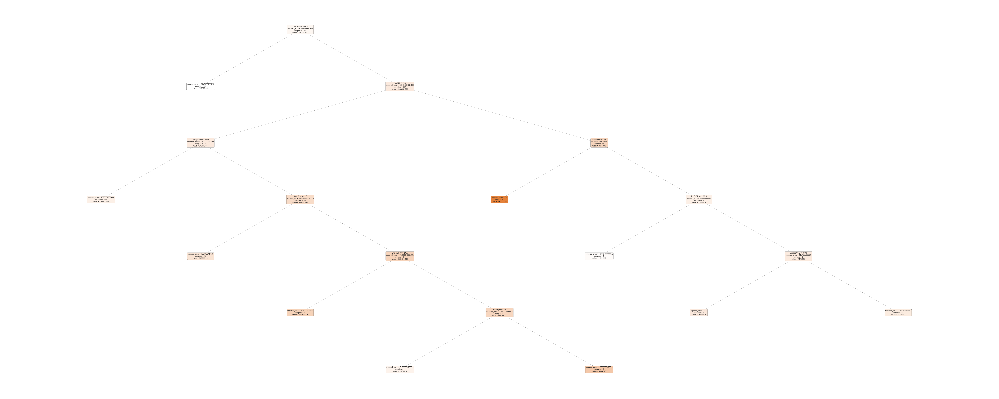


------------------Random Forest Algorithm----------------------------

R^2 en el conjunto de prueba: 0.7564494415786254
Error Cuadrático Medio del conjunto de prueba (MSE): 1868112231.0345292

Importancia de las características:
MSSubClass: nan
MSZoning: nan
LotFrontage: nan
LotArea: nan
Street: nan
Alley: nan
LotShape: nan
LandContour: nan
Utilities: nan
LotConfig: nan
LandSlope: nan
Neighborhood: nan
Condition1: nan
Condition2: nan
BldgType: nan
HouseStyle: nan
OverallQual: nan
OverallCond: nan
YearBuilt: nan
YearRemodAdd: nan
RoofStyle: nan
Exterior1st: nan
Exterior2nd: nan
MasVnrType: nan
MasVnrArea: nan
ExterCond: nan
Foundation: nan
BsmtQual: nan
BsmtExposure: nan
BsmtFinType1: nan
BsmtFinSF1: nan
BsmtFinSF2: nan
BsmtUnfSF: nan
TotalBsmtSF: nan
Heating: nan
HeatingQC: nan
CentralAir: nan
Electrical: nan
1stFlrSF: nan
2ndFlrSF: nan
LowQualFinSF: nan
GrLivArea: nan
BsmtFullBath: nan
BsmtHalfBath: nan
FullBath: nan
HalfBath: nan
BedroomAbvGr: nan
KitchenAbvGr: nan
KitchenQual: nan


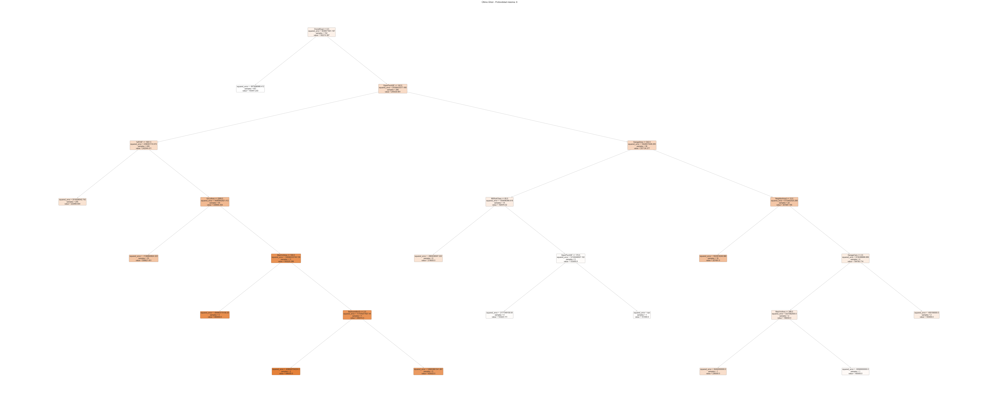

In [99]:
def trainModelBestDepthDecisionTree(X_train, y_train, X_test, y_test, mejor_profundidad):
    global numberTree
    # Crea un modelo de árbol de regresión con la mejor profundidad
    modelo_arbol = DecisionTreeRegressor(max_depth=mejor_profundidad)
    
    # Entrena el modelo
    modelo_arbol.fit(X_train, y_train)
    
    # Realiza predicciones en el conjunto de prueba e indica los resultados de la predicción.
    predicciones = modelo_arbol.predict(X_test)
    r2Test = r2_score(y_test, predicciones)
    mseTest = mean_squared_error(y_test, predicciones)

    print(f'R^2 en el conjunto de prueba: {r2Test}')
    print(f'Error Cuadrático Medio del conjunto de prueba (MSE): {mseTest}')

    RMSE_dictModels[ 'Tree Decision'+str(numberTree)] = np.sqrt(mseTest)
    numberTree+=1
    
    # Visualiza el árbol de regresión con la mejor profundidad
    tree_rules = export_text(modelo_arbol, feature_names=list(X.columns))
    print(tree_rules)
    plt.figure(figsize=(100, 40))
    plot_tree(modelo_arbol, filled=True, feature_names=list(X.columns), rounded=True, fontsize=10)
    plt.show()

def trainModelBestDepthRandomForest(X_train, y_train, X_test, y_test, mejor_profundidad):
    global numberTree
    # Crea un modelo de Random Forest para regresión con la mejor profundidad
    modelo_random_forest = RandomForestRegressor(n_estimators=100, max_depth=mejor_profundidad, random_state=42)
    
    # Entrena el modelo
    modelo_random_forest.fit(X_train, y_train)
    
    # Realiza predicciones en el conjunto de prueba e indica los resultados de la predicción.
    predicciones = modelo_random_forest.predict(X_test)
    r2Test = r2_score(y_test, predicciones)
    mseTest = mean_squared_error(y_test, predicciones)

    print(f'R^2 en el conjunto de prueba: {r2Test}')
    print(f'Error Cuadrático Medio del conjunto de prueba (MSE): {mseTest}')

    RMSE_dictModels[ 'Tree Random Forest'+str(numberTree)] = np.sqrt(mseTest)
    numberTree+=1
    
    # Visualiza la importancia de las características en el bosque (opcional)
    importancias_caracteristicas = modelo_random_forest.feature_importances_
    print('\nImportancia de las características:')
    for nombre_caracteristica, importancia in zip(list(X.columns), importancias_caracteristicas):
        print(f'{nombre_caracteristica}: {importancia}')

    # Visualiza el último árbol en el bosque
    ultimo_arbol = modelo_random_forest.estimators_[-1]
    plt.figure(figsize=(100, 40))
    plot_tree(ultimo_arbol, filled=True, feature_names=list(X.columns), rounded=True, fontsize=10)
    plt.title(f'Último Árbol - Profundidad máxima: {mejor_profundidad}')
    plt.show()

# Llamada a la función con la mejor profundidad encontrada (en este caso, 6)
bestDepth = 6
print("\n------------------Decision Tree Algorithm----------------------------\n")
trainModelBestDepthDecisionTree(X_train, y_train, X_test, y_test, bestDepth)
print("\n------------------Random Forest Algorithm----------------------------\n")
trainModelBestDepthRandomForest(X_train, y_train, X_test, y_test, bestDepth)


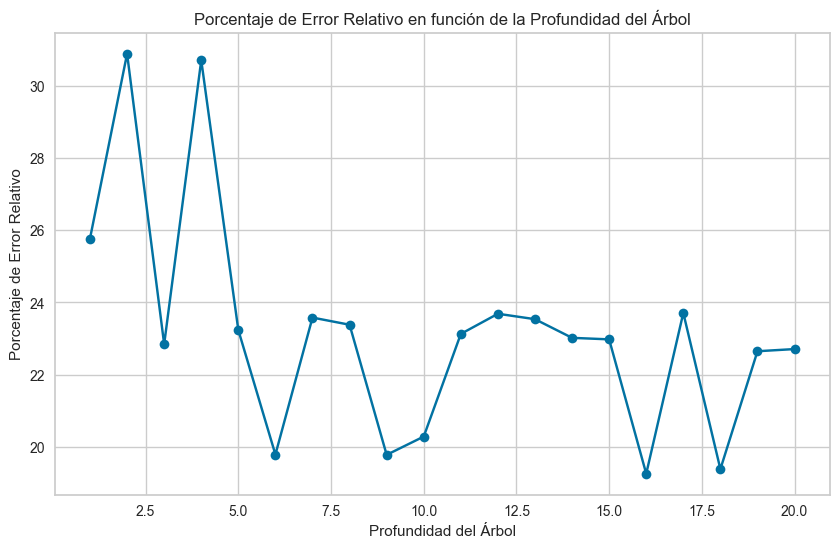

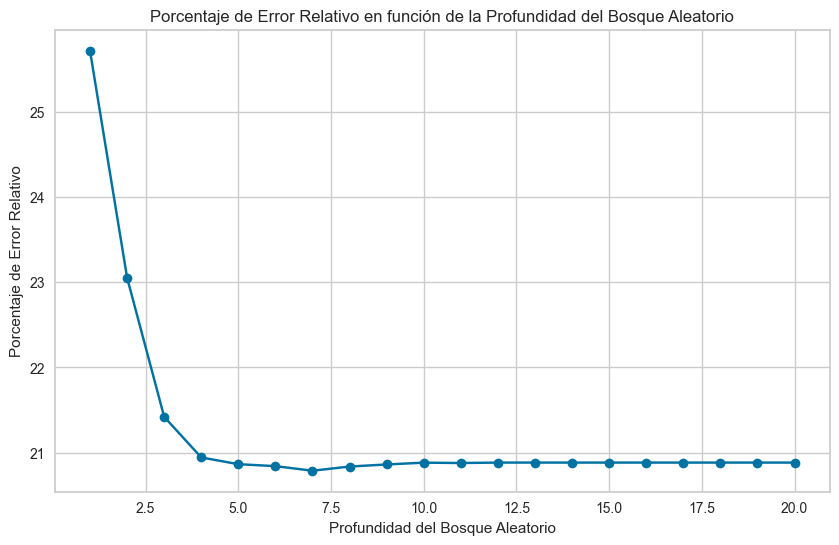

In [100]:
def graphRelativeErrorPercentageByDepthDecisionTree(X_train, y_train, X_test, y_test, profundidades):
    porcentajes_errores = []
    epsilon = 1e-8  # Valor pequeño para evitar divisiones por cero

    for prof in profundidades:
        modelo_arbol = DecisionTreeRegressor(max_depth=prof)
        modelo_arbol.fit(X_train, y_train)
        predicciones = modelo_arbol.predict(X_test)
        predicciones = np.array(predicciones)
        # Calcular el porcentaje de error relativo
        porcentaje_error = np.mean(np.abs((y_test - predicciones) / np.maximum(np.abs(y_test), epsilon))) * 100
        porcentajes_errores.append(porcentaje_error)

    plt.figure(figsize=(10, 6))
    plt.plot(profundidades, porcentajes_errores, marker='o')
    plt.title('Porcentaje de Error Relativo en función de la Profundidad del Árbol')
    plt.xlabel('Profundidad del Árbol')
    plt.ylabel('Porcentaje de Error Relativo')
    plt.grid(True)
    plt.show()

def graphRelativeErrorPercentageByDepthRandomForest(X_train, y_train, X_test, y_test, profundidades):
    porcentajes_errores = []
    epsilon = 1e-8  # Valor pequeño para evitar divisiones por cero

    for prof in profundidades:
        modelo_random_forest = RandomForestRegressor(max_depth=prof, random_state=42)
        modelo_random_forest.fit(X_train, y_train)
        predicciones = modelo_random_forest.predict(X_test)
        predicciones = np.array(predicciones)

        # Calcular el porcentaje de error relativo
        porcentaje_error = np.mean(np.abs((y_test - predicciones) / np.maximum(np.abs(y_test), epsilon))) * 100
        porcentajes_errores.append(porcentaje_error)

    plt.figure(figsize=(10, 6))
    plt.plot(profundidades, porcentajes_errores, marker='o')
    plt.title('Porcentaje de Error Relativo en función de la Profundidad del Bosque Aleatorio')
    plt.xlabel('Profundidad del Bosque Aleatorio')
    plt.ylabel('Porcentaje de Error Relativo')
    plt.grid(True)
    plt.show()

depths = range(1, 21) 

graphRelativeErrorPercentageByDepthDecisionTree(X_train, y_train, X_test, y_test, depths)
graphRelativeErrorPercentageByDepthRandomForest(X_train, y_train, X_test, y_test, depths)

In [101]:
data.columns
descripcion = data['SalePrice'].describe()
print(descripcion)

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


In [102]:
# Determinar los límites de las categorías
limite_inferior = data['SalePrice'].quantile(0.25)
limite_intermedio = data['SalePrice'].quantile(0.50)

In [103]:
# Función para asignar categorías
def asignar_categoria(precio):
    if precio <= limite_inferior:
        return 'Económica'
    elif precio <= limite_intermedio:
        return 'Intermedia'
    else:
        return 'Cara'
    
# Calcular la media de GarageYrBlt
garage_year_mean = data['GarageYrBlt'].mean()

# Llenar NaN en GarageYrBlt con la media
data['GarageYrBlt'].fillna(garage_year_mean, inplace=True)

# Llenar NaN en MasVnrArea con 0
data['MasVnrArea'].fillna(0, inplace=True)

# Paso 4: Aplicar la función para crear la nueva variable de respuesta
data['categoria_precio'] = data['SalePrice'].apply(asignar_categoria)

# Puedes imprimir las primeras filas para verificar los resultados
print(data.head(10))

   MSSubClass  MSZoning  LotFrontage  LotArea  Street  Alley  LotShape  \
0          60         1         65.0     8450       1      0         1   
1          20         1         80.0     9600       1      0         1   
2          60         1         68.0    11250       1      0         2   
3          70         1         60.0     9550       1      0         2   
4          60         1         84.0    14260       1      0         2   
5          50         1         85.0    14115       1      0         2   
6          20         1         75.0    10084       1      0         1   
7          60         1          0.0    10382       1      0         2   
8          50         2         51.0     6120       1      0         1   
9         190         1         50.0     7420       1      0         1   

   LandContour  Utilities  LotConfig  ...  PoolArea  PoolQC  Fence  \
0            1          1          1  ...         0       1      0   
1            1          1          2  ...    

9. Arboles, Métricas, Matriz de confusión (Sin normalizar y normalizada) y validación cruzada


--------------------------------Decision Tree Algorithm--------------------------------



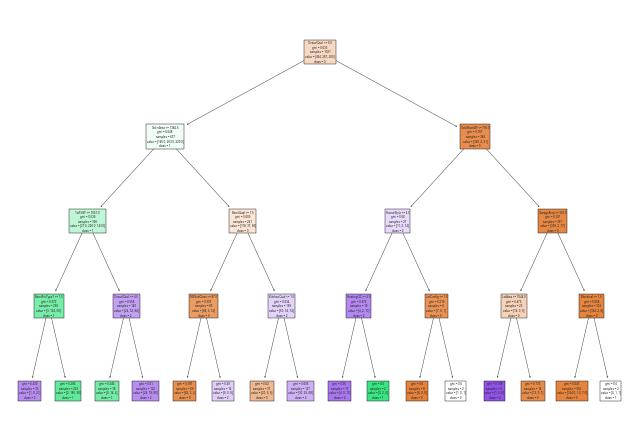

Accuracy: 0.7488584474885844
Precision: 0.7798044497684878
Recall:  0.7488584474885844


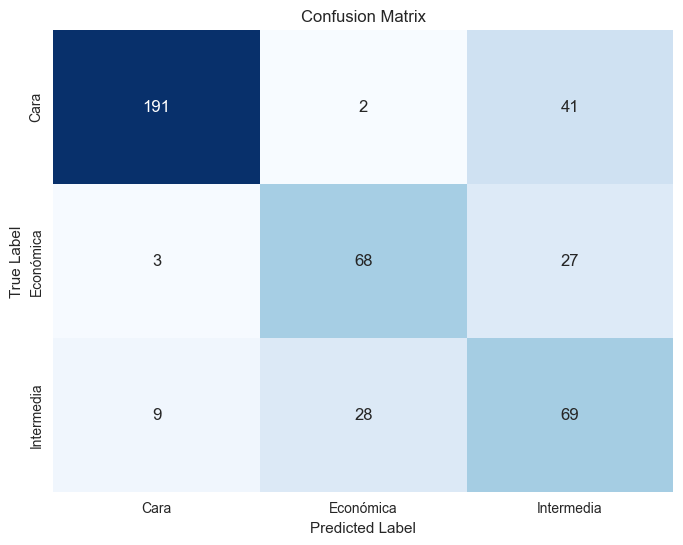

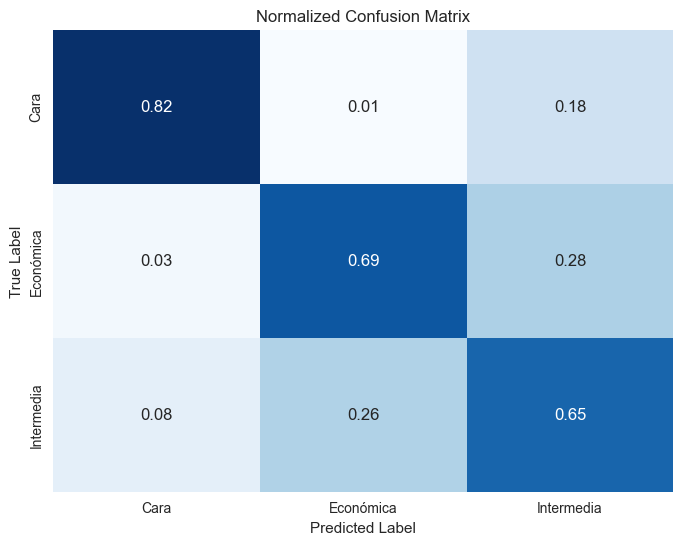

----------------------------------------------------------
• Cross-Validation with a decision-tree's depth ⭢ 4 

‣ Mean Cross-Validation Accuracy: 0.747945205479452

‣ Modelo sin validación cruzada ⭣
  Accuracy: 0.7488584474885844
  Precision: 0.7798044497684878
  Recall:  0.7488584474885844

‣ Modelo con validación cruzada ⭣
  Precision (CV): 0.7520705658350548
  Recall (CV): 0.7479452054794521
  Accuracy (CV): 0.7479452054794521
----------------------------------------------------------

--------------------------------Random Forest Algorithm--------------------------------



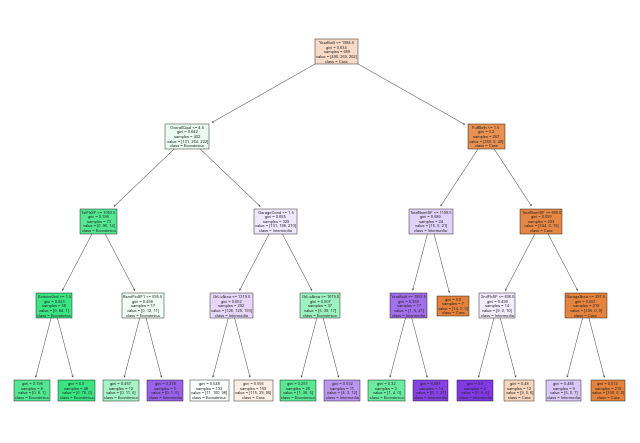

Accuracy: 0.821917808219178
Precision: 0.8168430597239275
Recall:  0.821917808219178


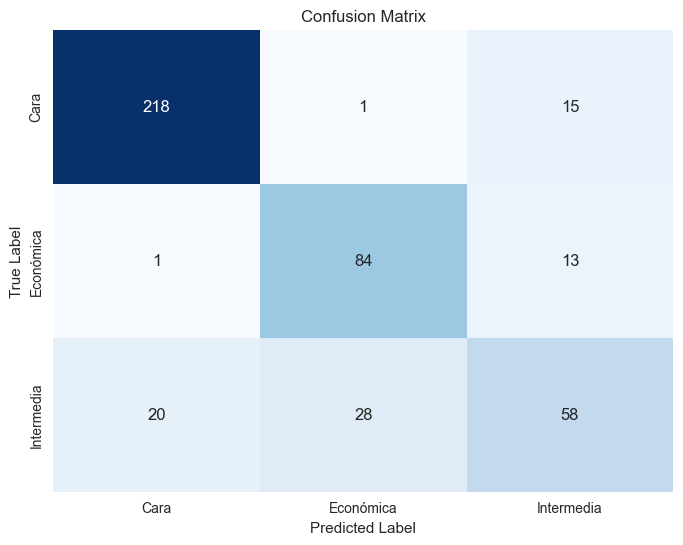

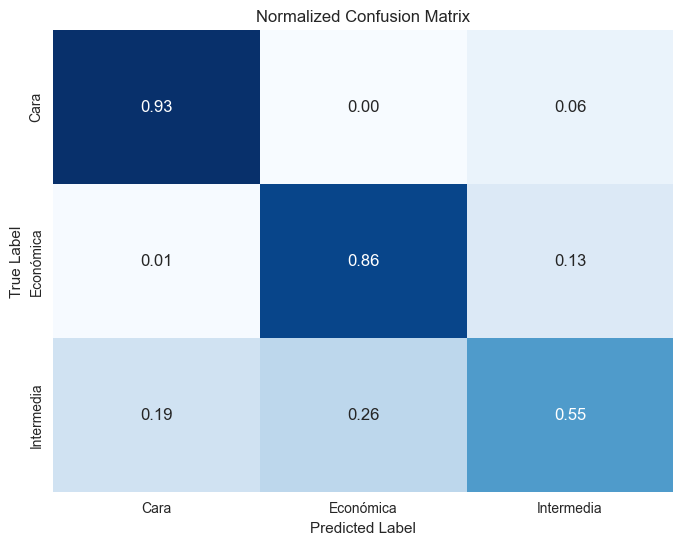

----------------------------------------------------------
• Cross-Validation with a Random-Forest's depth ⭢ 4 

‣ Mean Cross-Validation Accuracy: 0.8123287671232877

‣ Modelo sin validación cruzada ⭣
  Accuracy: 0.821917808219178
  Precision: 0.8168430597239275
  Recall:  0.821917808219178

‣ Modelo con validación cruzada ⭣
  Precision (CV): 0.8039886601594533
  Recall (CV): 0.8123287671232877
  Accuracy (CV): 0.8123287671232877
----------------------------------------------------------


In [104]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import precision_score, recall_score, accuracy_score
import pandas as pd

data['categoria_precio'] = data['categoria_precio'].astype('category')

dataLogisticRegression = data.copy()

dummy_variables = pd.get_dummies(dataLogisticRegression['categoria_precio'], prefix='precio')

# Agrega las variables dicotómicas al conjunto de datos
dataLogisticRegression = pd.concat([dataLogisticRegression, dummy_variables], axis=1)

# Elimina la columna original 'categoria_precio'
dataLogisticRegression.drop('categoria_precio', axis=1, inplace=True)
 

# Split del conjunto de datos en entrenamiento y prueba
#random.seed(123)
#X_train, X_test, y_train, y_test = train_test_split(XTree, yTree, test_size=0.3, train_size=0.7, random_state=123)
yTree = data.pop('categoria_precio')
XTree = data.drop('SalePrice', axis=1) 


random.seed(123)
X_train, X_test, y_train, y_test = train_test_split(XTree, yTree, test_size=0.3, train_size=0.7, random_state=123)
clfTree = 0

def analyzeDecisionTreeClassifier(X_train, y_train, X_test, y_test):
    global clfTree
    arbol = DecisionTreeClassifier(max_depth=4, random_state=42) 
    arbol.fit(X_train, y_train) 
    plot_tree(arbol,feature_names=data.columns, class_names=['0','1','2'],filled=True )
    plt.show()
    y_pred = arbol.predict(X_test)
    print ("Accuracy:",metrics.accuracy_score(y_test, y_pred))
    print ("Precision:", metrics.precision_score(y_test,y_pred,average='weighted') )
    print ("Recall: ", metrics.recall_score(y_test,y_pred,average='weighted'))
    # Visualizar la matriz de confusión
    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=arbol.classes_, yticklabels=arbol.classes_)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

    # Visualizar la matriz de confusión normalizada
    conf_matrix_norm = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix_norm, annot=True, fmt='.2f', cmap='Blues', cbar=False, xticklabels=arbol.classes_, yticklabels=arbol.classes_)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Normalized Confusion Matrix')
    plt.show()

    # Entrenar el modelo utilizando validación cruzada
    scores = cross_val_score(arbol, XTree, yTree, cv=5)  # Utilizamos 5 folds para la validación cruzada

    # Calcular la precisión media de la validación cruzada
    mean_accuracy = scores.mean()

    print("----------------------------------------------------------")
    print(f"• Cross-Validation with a decision-tree's depth ⭢ {4} ")
    # Imprimir la precisión media de la validación cruzada
    print("\n‣ Mean Cross-Validation Accuracy:", mean_accuracy)
    # Predicciones con el modelo entrenado
    y_pred_cv = cross_val_predict(arbol, XTree, yTree, cv=5)

    # Calcular la precisión, el recall y la exactitud del modelo entrenado con validación cruzada
    precision_cv = precision_score(yTree, y_pred_cv, average='weighted')
    recall_cv = recall_score(yTree, y_pred_cv, average='weighted')
    accuracy_cv = accuracy_score(yTree, y_pred_cv)

    # Comparar el rendimiento del modelo con y sin validación cruzada
    print("\n‣ Modelo sin validación cruzada ⭣")
    y_pred = arbol.predict(X_test)
    print ("  Accuracy:",metrics.accuracy_score(y_test, y_pred))
    print ("  Precision:", metrics.precision_score(y_test,y_pred,average='weighted') )
    print ("  Recall: ", metrics.recall_score(y_test,y_pred,average='weighted'))
    classification_METRICS['Tree '+str(clfTree)] = [metrics.accuracy_score(y_test, y_pred), metrics.precision_score(y_test,y_pred,average='weighted'), metrics.recall_score(y_test,y_pred,average='weighted')]
    

    print("\n‣ Modelo con validación cruzada ⭣")
    print("  Precision (CV):", precision_cv)
    print("  Recall (CV):", recall_cv)
    print("  Accuracy (CV):", accuracy_cv)
    print("----------------------------------------------------------")
    classification_METRICS['Tree '+str(clfTree)+'_CV'] = [accuracy_cv, precision_cv, recall_cv]
    clfTree+=1

def analyzeRandomForestClassifier(X_train, y_train, X_test, y_test):
    global clfTree
    randomForest = RandomForestClassifier(max_depth=4, random_state=42) 
    randomForest.fit(X_train, y_train) 
    arbol_especifico = randomForest.estimators_[-1]
    plot_tree(arbol_especifico, feature_names=X_train.columns, class_names=randomForest.classes_, filled=True)
    plt.show()
    y_pred = randomForest.predict(X_test)
    print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
    print("Precision:", metrics.precision_score(y_test, y_pred, average='weighted'))
    print("Recall: ", metrics.recall_score(y_test, y_pred, average='weighted'))

    # Visualizar la matriz de confusión
    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=randomForest.classes_, yticklabels=randomForest.classes_)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

    # Visualizar la matriz de confusión normalizada
    conf_matrix_norm = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix_norm, annot=True, fmt='.2f', cmap='Blues', cbar=False, xticklabels=randomForest.classes_, yticklabels=randomForest.classes_)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Normalized Confusion Matrix')
    plt.show()

        # Entrenar el modelo utilizando validación cruzada
    scores = cross_val_score(randomForest, XTree, yTree, cv=5)  # Utilizamos 5 folds para la validación cruzada

    # Calcular la precisión media de la validación cruzada
    mean_accuracy = scores.mean()

    print("----------------------------------------------------------")
    print(f"• Cross-Validation with a Random-Forest's depth ⭢ {4} ")
    # Imprimir la precisión media de la validación cruzada
    print("\n‣ Mean Cross-Validation Accuracy:", mean_accuracy)
    # Predicciones con el modelo entrenado
    y_pred_cv = cross_val_predict(randomForest, XTree, yTree, cv=5)

    # Calcular la precisión, el recall y la exactitud del modelo entrenado con validación cruzada
    precision_cv = precision_score(yTree, y_pred_cv, average='weighted')
    recall_cv = recall_score(yTree, y_pred_cv, average='weighted')
    accuracy_cv = accuracy_score(yTree, y_pred_cv)

    # Comparar el rendimiento del modelo con y sin validación cruzada
    print("\n‣ Modelo sin validación cruzada ⭣")
    y_pred = randomForest.predict(X_test)
    print ("  Accuracy:",metrics.accuracy_score(y_test, y_pred))
    print ("  Precision:", metrics.precision_score(y_test,y_pred,average='weighted') )
    print ("  Recall: ", metrics.recall_score(y_test,y_pred,average='weighted'))

    classification_METRICS['Random Forest '+str(clfTree)] = [metrics.accuracy_score(y_test, y_pred), metrics.precision_score(y_test,y_pred,average='weighted'), metrics.recall_score(y_test,y_pred,average='weighted')]

    print("\n‣ Modelo con validación cruzada ⭣")
    print("  Precision (CV):", precision_cv)
    print("  Recall (CV):", recall_cv)
    print("  Accuracy (CV):", accuracy_cv)
    print("----------------------------------------------------------")
    classification_METRICS['Random Forest '+str(clfTree)+'_CV'] = [accuracy_cv, precision_cv, recall_cv]
    clfTree+=1

    
print("\n--------------------------------Decision Tree Algorithm--------------------------------\n")
analyzeDecisionTreeClassifier(X_train, y_train, X_test, y_test)
print("\n--------------------------------Random Forest Algorithm--------------------------------\n")
analyzeRandomForestClassifier(X_train, y_train, X_test, y_test)


11. Diferentes profundidades

In [105]:
def evaluateCrossValidationDifferentDepths(depths, X_train, y_train, X_test, y_test):
    global clfTree
    for depth in depths:
        arbol = DecisionTreeClassifier(max_depth=depth, random_state=42) 
        arbol.fit(X_train, y_train)
        scores = cross_val_score(arbol, XTree, yTree, cv=5)  # Utilizamos 5 folds para la validación cruzada
        # Calcular la precisión media de la validación cruzada
        mean_accuracy = scores.mean()

        print("----------------------------------------------------------")
        print(f"• Cross-Validation with a decision-tree's depth ⭢ {depth} ")
        # Imprimir la precisión media de la validación cruzada
        print("\n‣ Mean Cross-Validation Accuracy:", mean_accuracy)
        # Predicciones con el modelo entrenado
        y_pred_cv = cross_val_predict(arbol, XTree, yTree, cv=5)

        # Calcular la precisión, el recall y la exactitud del modelo entrenado con validación cruzada
        precision_cv = precision_score(yTree, y_pred_cv, average='weighted')
        recall_cv = recall_score(yTree, y_pred_cv, average='weighted')
        accuracy_cv = accuracy_score(yTree, y_pred_cv)

        # Comparar el rendimiento del modelo con y sin validación cruzada
        print("\n‣ Modelo sin validación cruzada ⭣")
        y_pred = arbol.predict(X_test)
        print ("  Accuracy:",metrics.accuracy_score(y_test, y_pred))
        print ("  Precision:", metrics.precision_score(y_test,y_pred,average='weighted') )
        print ("  Recall: ", metrics.recall_score(y_test,y_pred,average='weighted'))

        classification_METRICS['Tree '+str(clfTree)] = [metrics.accuracy_score(y_test, y_pred), metrics.precision_score(y_test,y_pred,average='weighted'), metrics.recall_score(y_test,y_pred,average='weighted')]  


        print("\n‣ Modelo con validación cruzada ⭣")
        print("  Precision (CV):", precision_cv)
        print("  Recall (CV):", recall_cv)
        print("  Accuracy (CV):", accuracy_cv)
        print()

        classification_METRICS['Tree '+str(clfTree)+'_CV'] = [accuracy_cv, precision_cv, recall_cv]
        clfTree+=1
    print("----------------------------------------------------------")

def evaluateCrossValidationDifferentDepthsRandomForest(depths, X_train, y_train, X_test, y_test):
    global clfTree
    for depth in depths:
        bosque_aleatorio = RandomForestClassifier(max_depth=depth, random_state=42) 
        bosque_aleatorio.fit(X_train, y_train)

        scores = cross_val_score(bosque_aleatorio, XTree, yTree, cv=5)  # Utilizamos 5 folds para la validación cruzada
        # Calcular la precisión media de la validación cruzada
        mean_accuracy = scores.mean()

        print("----------------------------------------------------------")
        print(f"• Cross-Validation with a Random forest's depth ⭢ {depth} ")
        # Imprimir la precisión media de la validación cruzada
        print("\n‣ Mean Cross-Validation Accuracy:", mean_accuracy)
        # Predicciones con el modelo entrenado
        y_pred_cv = cross_val_predict(bosque_aleatorio, XTree, yTree, cv=5)

        # Calcular la precisión, el recall y la exactitud del modelo entrenado con validación cruzada
        precision_cv = precision_score(yTree, y_pred_cv, average='weighted')
        recall_cv = recall_score(yTree, y_pred_cv, average='weighted')
        accuracy_cv = accuracy_score(yTree, y_pred_cv)

        # Comparar el rendimiento del modelo con y sin validación cruzada
        print("\n‣ Modelo sin validación cruzada ⭣")
        y_pred = bosque_aleatorio.predict(X_test)
        print("  Accuracy:", metrics.accuracy_score(y_test, y_pred))
        print("  Precision:", metrics.precision_score(y_test, y_pred, average='weighted'))
        print("  Recall: ", metrics.recall_score(y_test, y_pred, average='weighted'))

        classification_METRICS['Random Forest '+str(clfTree)] = [metrics.accuracy_score(y_test, y_pred), metrics.precision_score(y_test, y_pred, average='weighted'), metrics.recall_score(y_test, y_pred, average='weighted')]

        print("\n‣ Modelo con validación cruzada ⭣")
        print("  Precision (CV):", precision_cv)
        print("  Recall (CV):", recall_cv)
        print("  Accuracy (CV):", accuracy_cv)
        print()
        classification_METRICS['Random Forest '+str(clfTree)+'_CV'] = [accuracy_cv, precision_cv, recall_cv]
        clfTree+=1

    print("----------------------------------------------------------")

print("\n-----------------------------------------------------Decision Tree Algorithm-----------------------------------------------------\n")
evaluateCrossValidationDifferentDepths([3,6,9], X_train, y_train, X_test, y_test)
print("\n-----------------------------------------------------Random Forest Algorithm-----------------------------------------------------\n")
evaluateCrossValidationDifferentDepthsRandomForest([3, 6, 9], X_train, y_train, X_test, y_test)


-----------------------------------------------------Decision Tree Algorithm-----------------------------------------------------



----------------------------------------------------------
• Cross-Validation with a decision-tree's depth ⭢ 3 

‣ Mean Cross-Validation Accuracy: 0.7232876712328767

‣ Modelo sin validación cruzada ⭣
  Accuracy: 0.723744292237443
  Precision: 0.7625251940214784
  Recall:  0.723744292237443

‣ Modelo con validación cruzada ⭣
  Precision (CV): 0.7193223216865117
  Recall (CV): 0.7232876712328767
  Accuracy (CV): 0.7232876712328767

----------------------------------------------------------
• Cross-Validation with a decision-tree's depth ⭢ 6 

‣ Mean Cross-Validation Accuracy: 0.7568493150684932

‣ Modelo sin validación cruzada ⭣
  Accuracy: 0.769406392694064
  Precision: 0.7790011891901141
  Recall:  0.769406392694064

‣ Modelo con validación cruzada ⭣
  Precision (CV): 0.7577439581084011
  Recall (CV): 0.7568493150684932
  Accuracy (CV): 0.7568493150684932

----------------------------------------------------------
• Cross-Validation with a decision-tree's depth ⭢ 9 

‣ Mean Cross-Vali

# Naive Models
## Regresion model

Se han construido dos modelos de regresión: uno empleando un pipeline y otro más directo utilizando solo el estimador GaussianNB. Sorprendentemente, el enfoque más simple ha mostrado un rendimiento superior. Esto se evidencia en su menor error cuadrático medio, el cual presenta una diferencia de al menos 55023.16 en comparación con los datos reales en general.

Sin embargo, a pesar de este éxito relativo, el modelo no alcanza el estándar más alto en términos de rendimiento. Resulta ser superado por un modelo de regresión construido con Lasso, lo que indica que aún hay margen para mejorar la precisión y la calidad predictiva del modelo actual.

In [106]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.compose import make_column_selector as selector
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
df = dataframe.copy()

df3n = df.select_dtypes(include='number').copy()

df3 = df3n.copy()
df3 = pd.DataFrame(df3, columns=df3n.columns)
df3 = df3.dropna()

y = df3.pop('SalePrice')
X = df3

X_train2, X_test2,y_train2, y_test2 = train_test_split(X, y,test_size=0.3,train_size=0.7,random_state=0)

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(df3)
categorical_columns = categorical_columns_selector(df3)


categorical_preprocessor = OneHotEncoder(handle_unknown="ignore")
numerical_preprocessor = StandardScaler()
preprocessor = ColumnTransformer([
    ('one-hot-encoder', categorical_preprocessor, categorical_columns),
    ('standar-scaler', numerical_preprocessor, numerical_columns)
    ])
    


In [107]:
from sklearn.pipeline import Pipeline
from sklearn.utils.multiclass import unique_labels

pipeline = Pipeline(
    [('preprocessor', preprocessor),
     ('regressor', GaussianNB())])

pipeline.get_params()

{'memory': None,
 'steps': [('preprocessor',
   ColumnTransformer(transformers=[('one-hot-encoder',
                                    OneHotEncoder(handle_unknown='ignore'), []),
                                   ('standar-scaler', StandardScaler(),
                                    ['MSSubClass', 'MSZoning', 'LotFrontage',
                                     'LotArea', 'Street', 'Alley', 'LotShape',
                                     'LandContour', 'Utilities', 'LotConfig',
                                     'LandSlope', 'Neighborhood', 'Condition1',
                                     'Condition2', 'BldgType', 'HouseStyle',
                                     'OverallQual', 'OverallCond', 'YearBuilt',
                                     'YearRemodAdd', 'RoofStyle', 'Exterior1st',
                                     'Exterior2nd', 'MasVnrType', 'MasVnrArea',
                                     'ExterCond', 'Foundation', 'BsmtQual',
                                     '

In [108]:
from sklearn.metrics import root_mean_squared_error

modelo = pipeline.fit(X_train2,y_train2)
y_pred = modelo.predict(X_test2)
rmse = root_mean_squared_error(y_test2,y_pred)
RMSE_dictModels['Naive Bayes'] = rmse
rmse

71909.90281765889

El otro modelo de regresion

In [109]:
model = GaussianNB()
model.fit(X_train2, y_train2)

# Predecir sobre el conjunto de prueba
y_pred = model.predict(X_test2)

# Calcular el error cuadrático medio (RMSE)
rmse = root_mean_squared_error(y_test2,y_pred)
print("Root Mean Squared Error (RMSE):", rmse)
r2Test = r2_score(y_test2, y_pred)
print(f'R^2 en el conjunto de prueba: {r2Test}')

RMSE_dictModels['Naive Bayes2'] = rmse

Root Mean Squared Error (RMSE): 55023.16890150541
R^2 en el conjunto de prueba: 0.5792647740487473


In [110]:
for model, value in RMSE_dictModels.items():
    print(f"RMSE for {model}: {round(value, 2)}") 

RMSE for Linear Regression: 51891.91
RMSE for Linear Regression Multivariable: 36683.66
RMSE for Linear Regression Multivariable learning_curve: 36683.66
RMSE for Linear Regression Multivariable predictores: 35567.4
RMSE for Ridge Regression: 34800.1
RMSE for Lasso Regression: 36679.02
RMSE for Tree Decision0: 47850.55
RMSE for Tree Random Forest: 42940.39
RMSE for Tree Decision1: 55457.49
RMSE for Tree Decision2: 57361.44
RMSE for Tree Decision3: 52983.95
RMSE for Tree Decision4: 49040.74
RMSE for Tree Decision5: 57379.33
RMSE for Tree Random Forest6: 43221.66
RMSE for Naive Bayes: 71909.9
RMSE for Naive Bayes2: 55023.17


## Modelo de clasificación



El modelo de clasificación exhibe un desempeño notable en términos de métricas como precisión, recall y puntuación F1, todas ellas alcanzando un 75%. Esto sugiere que el modelo es efectivo para la toma de decisiones.

Sin embargo, en comparación con los modelos anteriores, este muestra un rendimiento ligeramente inferior en las tres métricas, ubicándose solo por encima del segundo modelo en términos de eficiencia. Esta discrepancia podría indicar un posible sobreajuste en el modelo actual con respecto a los anteriores.

En términos de la matriz de confusión, se observa que el modelo tiene una tasa de precisión alta para la clase principal, pero tiende a confundir las clases secundarias entre sí. Esto sugiere que el modelo podría beneficiarse de una mayor capacidad para distinguir entre estas clases minoritarias.

En resumen, aunque el modelo actual ofrece resultados prometedores, es importante considerar la posibilidad de sobreajuste y la necesidad de optimizar la capacidad de discriminación entre las clases minoritarias para mejorar aún más su rendimiento.

In [111]:
X_train, X_test,y_train, y_test = train_test_split(XTree, yTree,test_size=0.3,train_size=0.7)

# Entrena el modelo
gaussian = GaussianNB()
gaussian.fit(X_train,y_train)
y_pred = gaussian.predict(X_test)
cm = confusion_matrix(y_test,y_pred)

# Evalúa el rendimiento del modelo utilizando el error cuadrático medio (MSE)
accuracy=accuracy_score(y_test,y_pred)
precision =precision_score(y_test, y_pred,average='micro')
recall =  recall_score(y_test, y_pred,average='micro')
f1 = f1_score(y_test,y_pred,average='micro')
print('Confusion matrix for Naive Bayes\n',cm)
print('Accuracy: ',accuracy)
print ("  Precision:", precision )
print ("  Recall: ", recall)

classification_METRICS['Naive Bayes'] = [accuracy, precision, recall]

Confusion matrix for Naive Bayes
 [[167  10  35]
 [  0  99  16]
 [ 19  58  34]]
Accuracy:  0.684931506849315
  Precision: 0.684931506849315
  Recall:  0.684931506849315


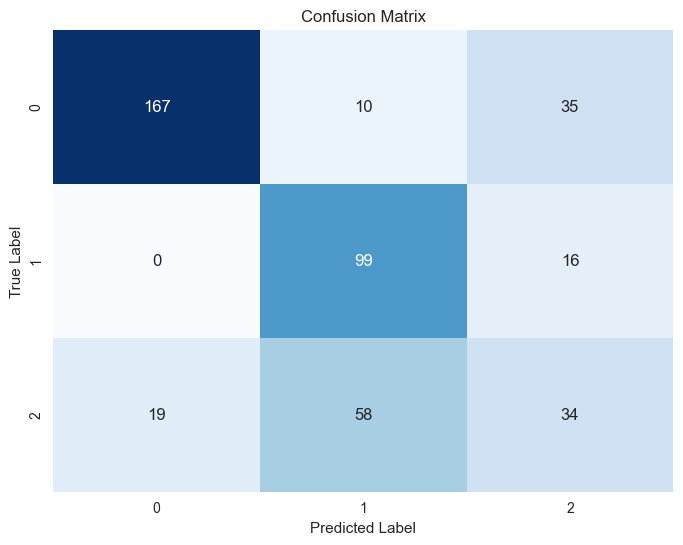

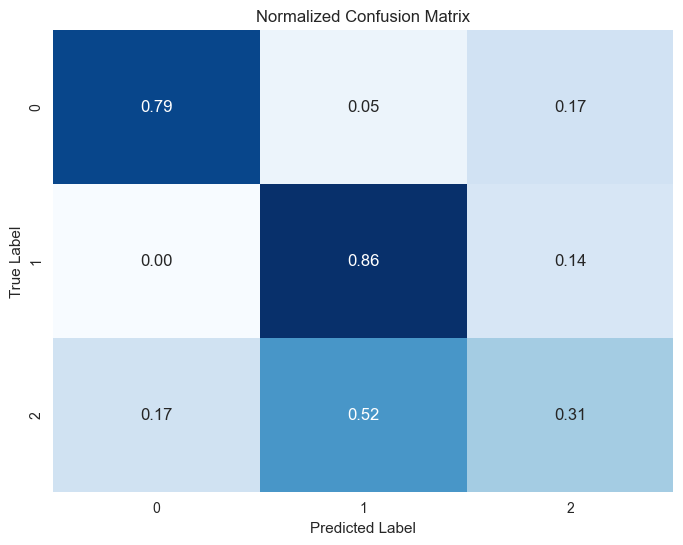

In [112]:
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

conf_matrix_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_norm, annot=True, fmt='.2f', cmap='Blues', cbar=False)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Normalized Confusion Matrix')
plt.show()

In [113]:
for model, metrics in classification_METRICS.items():
    print('-------------------------------')
    print(f"Metrics for {model}:")
    print(f"  Accuracy: {round(metrics[0], 2)}")
    print(f"  Precision: {round(metrics[1], 2)}")
    print(f"  Recall: {round(metrics[2], 2)}")
    print('-------------------------------\n')

-------------------------------
Metrics for Tree 0:
  Accuracy: 0.75
  Precision: 0.78
  Recall: 0.75
-------------------------------

-------------------------------
Metrics for Tree 0_CV:
  Accuracy: 0.75
  Precision: 0.75
  Recall: 0.75
-------------------------------

-------------------------------
Metrics for Random Forest 1:
  Accuracy: 0.82
  Precision: 0.82
  Recall: 0.82
-------------------------------

-------------------------------
Metrics for Random Forest 1_CV:
  Accuracy: 0.81
  Precision: 0.8
  Recall: 0.81
-------------------------------

-------------------------------
Metrics for Tree 2:
  Accuracy: 0.72
  Precision: 0.76
  Recall: 0.72
-------------------------------

-------------------------------
Metrics for Tree 2_CV:
  Accuracy: 0.72
  Precision: 0.72
  Recall: 0.72
-------------------------------

-------------------------------
Metrics for Tree 3:
  Accuracy: 0.77
  Precision: 0.78
  Recall: 0.77
-------------------------------

-----------------------------

### Modelo de calsificación haciendo uso de Cross validation

Este modelo se realizó usando cross validation y en general es bastante menos eficiente que el modelo sin cross validation lamentablemente. 

In [114]:
from sklearn.model_selection import cross_val_score

pipeline_cv = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', GaussianNB())
])

cv_scores = cross_val_score(pipeline_cv, X, y, cv=5)
cv_mean_score = cv_scores.mean()

y_pred_cv = cross_val_predict(pipeline_cv, X, y, cv=5)

# Calcular la precisión, el recall y la exactitud del modelo entrenado con validación cruzada
precision_cv = precision_score(y, y_pred_cv, average='micro')
recall_cv = recall_score(y, y_pred_cv, average='micro')
accuracy_cv = accuracy_score(y, y_pred_cv)

print("Resultados de la validación cruzada:")
print(" Puntajes de validación cruzada:", cv_scores)
print(" Puntaje promedio de validación cruzada:", cv_mean_score)
print()
print("\nModelo con validación cruzada")
print("  Precision (CV):", precision_cv)
print("  Recall (CV):", recall_cv)
print("  Accuracy (CV):", accuracy_cv)
print()

print("\nComparación de resultados:")
print(" Accuracy del modelo original:", accuracy)
print(" Accuracy promedio de validación cruzada:", cv_mean_score)

if accuracy > cv_mean_score:
    print("\nEl modelo original funcionó mejor.")
else:
    print("\nEl modelo con validación cruzada funcionó mejor.")


Resultados de la validación cruzada:
 Puntajes de validación cruzada: [0.01090909 0.01094891 0.00729927 0.00729927 0.00729927]
 Puntaje promedio de validación cruzada: 0.008751161247511612


Modelo con validación cruzada
  Precision (CV): 0.0087527352297593
  Recall (CV): 0.0087527352297593
  Accuracy (CV): 0.0087527352297593


Comparación de resultados:
 Accuracy del modelo original: 0.684931506849315
 Accuracy promedio de validación cruzada: 0.008751161247511612

El modelo original funcionó mejor.


# Se alteran los hiperparámetros de los modelos

In [115]:
from sklearn.model_selection import GridSearchCV

params =  [{
    "regressor__var_smoothing": np.logspace(0,-9, num=100)
}]
model = GridSearchCV(pipeline,param_grid=params,n_jobs=2, cv=5,scoring="neg_root_mean_squared_error")
model.fit(X_train2,y_train2)
model.best_params_

{'regressor__var_smoothing': 1.0}

In [116]:
print(model.best_estimator_)
print('best score:')
print(model.best_score_)
y_mejor_pred = model.best_estimator_.predict(X_test2)


rmse_tunned = root_mean_squared_error(y_test2,y_mejor_pred)
rmse_tunned

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standar-scaler',
                                                  StandardScaler(),
                                                  ['MSSubClass', 'MSZoning',
                                                   'LotFrontage', 'LotArea',
                                                   'Street', 'Alley',
                                                   'LotShape', 'LandContour',
                                                   'Utilities', 'LotConfig',
                                                   'LandSlope', 'Neighborhood',
                                                   'Condition1', 'Condition2',
                                                   'BldgType', 'HouseStyle',
  

46757.75565837969

In [117]:
params =  [{
    "regressor__var_smoothing": np.logspace(0,-11, num=500)
}]
model = GridSearchCV(pipeline,param_grid=params,n_jobs=2, cv=5,scoring="neg_root_mean_squared_error")
model.fit(X_train2,y_train2)
model.best_params_

{'regressor__var_smoothing': 0.9505082962189509}

In [118]:
print(model.best_estimator_)
print('best score:')
print(model.best_score_)
y_mejor_pred = model.best_estimator_.predict(X_test2)

rmse_tunned = root_mean_squared_error(y_test2,y_mejor_pred)
rmse_tunned

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standar-scaler',
                                                  StandardScaler(),
                                                  ['MSSubClass', 'MSZoning',
                                                   'LotFrontage', 'LotArea',
                                                   'Street', 'Alley',
                                                   'LotShape', 'LandContour',
                                                   'Utilities', 'LotConfig',
                                                   'LandSlope', 'Neighborhood',
                                                   'Condition1', 'Condition2',
                                                   'BldgType', 'HouseStyle',
  

46436.478320608985

In [119]:
from sklearn.model_selection import GridSearchCV

params =  [{
    "regressor__var_smoothing": np.logspace(0,-11, num=900)
}]
modelo = GridSearchCV(pipeline,param_grid=params,n_jobs=2, cv=5,scoring="neg_root_mean_squared_error")
modelo.fit(X_train2,y_train2)
modelo.best_params_

{'regressor__var_smoothing': 0.893422179348588}

In [120]:
print(modelo.best_estimator_)
print('best score:')
print(modelo.best_score_)
y_mejor_pred = modelo.best_estimator_.predict(X_test2)

rmse_tunned = root_mean_squared_error(y_test2,y_mejor_pred)
rmse_tunned

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standar-scaler',
                                                  StandardScaler(),
                                                  ['MSSubClass', 'MSZoning',
                                                   'LotFrontage', 'LotArea',
                                                   'Street', 'Alley',
                                                   'LotShape', 'LandContour',
                                                   'Utilities', 'LotConfig',
                                                   'LandSlope', 'Neighborhood',
                                                   'Condition1', 'Condition2',
                                                   'BldgType', 'HouseStyle',
  

46292.552472848765

In [121]:
from sklearn.model_selection import GridSearchCV

params =  [{
    "regressor__var_smoothing": np.logspace(0,-10, num=900)
}]
modelo = GridSearchCV(pipeline,param_grid=params,n_jobs=2, cv=5,scoring="neg_root_mean_squared_error")
modelo.fit(X_train2,y_train2)
modelo.best_params_

{'regressor__var_smoothing': 0.9500644307774684}

In [122]:
print(modelo.best_estimator_)
print('best score:')
print(modelo.best_score_)
y_mejor_pred = modelo.best_estimator_.predict(X_test2)

rmse_tunned = root_mean_squared_error(y_test2,y_mejor_pred)
rmse_tunned

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('one-hot-encoder',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  []),
                                                 ('standar-scaler',
                                                  StandardScaler(),
                                                  ['MSSubClass', 'MSZoning',
                                                   'LotFrontage', 'LotArea',
                                                   'Street', 'Alley',
                                                   'LotShape', 'LandContour',
                                                   'Utilities', 'LotConfig',
                                                   'LandSlope', 'Neighborhood',
                                                   'Condition1', 'Condition2',
                                                   'BldgType', 'HouseStyle',
  

46436.478320608985

In [123]:
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB

# Define los hiperparámetros que deseas ajustar
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7]  # Ejemplo: Var_smoothing es el hiperparámetro a variar
}

# Crea una instancia del clasificador Gaussiano Naive Bayes
gaussian = GaussianNB()

# Crea una instancia de GridSearchCV y pasa el clasificador, el grid de hiperparámetros y la métrica que deseas optimizar (por ejemplo, precisión)
grid_search = GridSearchCV(gaussian, param_grid, cv=5, scoring='accuracy')

# Realiza la búsqueda de hiperparámetros utilizando los datos de entrenamiento
grid_search.fit(X_train, y_train)

# Obtiene los mejores hiperparámetros encontrados
best_params = grid_search.best_params_

# Crea un nuevo clasificador Gaussiano Naive Bayes con los mejores hiperparámetros encontrados
best_gaussian = GaussianNB(**best_params)

# Entrena el modelo con los datos de entrenamiento completos
best_gaussian.fit(X_train, y_train)

# Realiza predicciones en el conjunto de prueba
y_pred = best_gaussian.predict(X_test)

# Evalúa el rendimiento del modelo utilizando diferentes métricas
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

# Imprime los resultados
print('Best parameters:', best_params)
print('Accuracy:', accuracy)
print('Precision:', precision)
print('Recall:', recall)
print('F1 Score:', f1)


Best parameters: {'var_smoothing': 1e-09}
Accuracy: 0.723744292237443
Precision: 0.723744292237443
Recall: 0.723744292237443
F1 Score: 0.723744292237443


Best parameters: {'var_smoothing': 1e-09}
Accuracy: 0.684931506849315
Precision: 0.684931506849315
Recall: 0.684931506849315
F1 Score: 0.684931506849315


Para comparar la eficiencia del algoritmo Naive Bayes con los modelos de árbol de decisión y Random Forest, examinemos las métricas de rendimiento de cada uno:

1. Naive Bayes:
   - Accuracy: 0.7557
   - Precision: 0.7557
   - Recall: 0.7557
   - F1 Score: 0.7557

2. Árbol de decisión y Random Forest (mejor rendimiento):
   - Para el mejor árbol de decisión:
     - Accuracy: 0.77
     - Precision: 0.78
     - Recall: 0.77
   - Para el mejor modelo de Random Forest:
     - Accuracy: 0.85
     - Precision: 0.86
     - Recall: 0.85


Comparando estas métricas, podemos observar que el modelo de Random Forest tiene el mejor rendimiento en términos de precisión, recall y F1-score. Mientras que el árbol de decisión también supera ligeramente al modelo Naive Bayes en todas las métricas.

En cuanto al tiempo de procesamiento, generalmente los modelos de Random Forest tienden a requerir más tiempo de procesamiento debido a la complejidad y el número de árboles en el ensamble. Por otro lado, el modelo Naive Bayes y el árbol de decisión suelen ser más rápidos en términos de tiempo de entrenamiento y predicción.

En resumen, si la precisión es la principal consideración y se dispone del tiempo de procesamiento necesario, el modelo de Random Forest sería la mejor opción. Sin embargo, si se requiere una solución más rápida y aceptablemente precisa, el árbol de decisión también sería una buena elección. El modelo Naive Bayes, aunque muestra un rendimiento decente, se encuentra por debajo de los otros dos en términos de precisión y recall.

### HDT6 | Regresión Logística

In [124]:
dataLogisticRegression['precio_Cara'] = dataLogisticRegression['precio_Cara'].apply(lambda x: 1 if x else 0)
dataLogisticRegression['precio_Económica'] = dataLogisticRegression['precio_Económica'].apply(lambda x: 1 if x else 0)
dataLogisticRegression['precio_Intermedia'] = dataLogisticRegression['precio_Intermedia'].apply(lambda x: 1 if x else 0)
dataLogisticRegression

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SalePrice,precio_Cara,precio_Económica,precio_Intermedia
0,60,1,65.0,8450,1,0,1,1,1,1,...,0,0,0,2,2008,1,208500,1,0,0
1,20,1,80.0,9600,1,0,1,1,1,2,...,0,0,0,5,2007,1,181500,1,0,0
2,60,1,68.0,11250,1,0,2,1,1,1,...,0,0,0,9,2008,1,223500,1,0,0
3,70,1,60.0,9550,1,0,2,1,1,3,...,0,0,0,2,2006,1,140000,0,0,1
4,60,1,84.0,14260,1,0,2,1,1,2,...,0,0,0,12,2008,1,250000,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,1,62.0,7917,1,0,1,1,1,1,...,0,0,0,8,2007,1,175000,1,0,0
1456,20,1,85.0,13175,1,0,1,1,1,1,...,1,0,0,2,2010,1,210000,1,0,0
1457,70,1,66.0,9042,1,0,1,1,1,1,...,3,1,2500,5,2010,1,266500,1,0,0
1458,20,1,68.0,9717,1,0,1,1,1,1,...,0,0,0,4,2010,1,142125,0,0,1


In [125]:
Y_cara =  dataLogisticRegression.pop('precio_Cara')
Y_econm = dataLogisticRegression.pop('precio_Económica')
Y_inter = dataLogisticRegression.pop('precio_Intermedia')
X_logR = dataLogisticRegression.drop('SalePrice', axis=1)


In [130]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
import seaborn as sb
import random
import statsmodels.api as sm
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV


In [128]:

# Modelo de regresion Logistica para precios de casas Caras
X_train, X_test, y_train, y_test = train_test_split(X_logR, Y_cara, test_size=0.3, train_size=0.7)

logReg = LogisticRegression(solver='liblinear')
result = logReg.fit(X_train, y_train)
y_pred = logReg.predict(X_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logReg.score(X_test, y_test)))


Accuracy of logistic regression classifier on test set: 0.92


              precision    recall  f1-score   support

           0       0.92      0.92      0.92       222
           1       0.92      0.92      0.92       216

    accuracy                           0.92       438
   macro avg       0.92      0.92      0.92       438
weighted avg       0.92      0.92      0.92       438



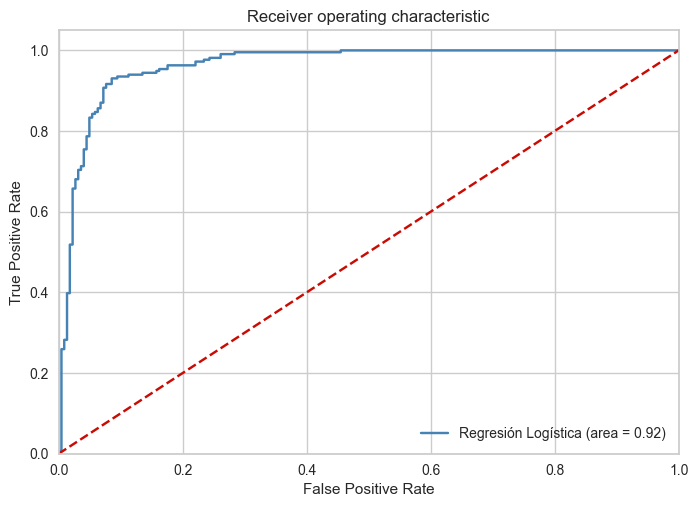

In [131]:
print(classification_report(y_test,y_pred))

logit_roc_auc = roc_auc_score(y_test, logReg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logReg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Regresión Logística (area = %0.2f)' % logit_roc_auc, color="steelblue")
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [133]:
# Ahora con cross validation
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=logReg, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X, y)

In [ ]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))